<a href="https://colab.research.google.com/github/Murcha1990/ML_AI24/blob/main/Hometasks/Pro/AI_HW1_Regression_with_inference_pro.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Домашнее задание №1 (pro)**

В этом домашнем задании вам будет необходимо:
*  обучить модель регрессии для предсказания стоимости автомобилей;
* реализовать веб-сервис для применения построенной модели на новых данных

> Оценка за домашку = $min(\text{ваш балл}, 11)$

**Мягкий дедлайн: 27 ноября 23:59**

**Жесткий дедлайн: 20 декабря 23:59 (конец модуля)**



**Примечание**

В каждой части оцениваются как код, **так и ответы на вопросы.** Вопросы подсвечены синим цветом.

Если нет одного и/или другого, то часть баллов за соответствующее задание снимается.

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import random
import seaborn as sns
import re

random.seed(42)
np.random.seed(42)

### **Задание 0**
Для чего фиксируем сиды в домашках?

Сиды необходимо фиксировать для воспроизведения такой же последовательности случайных чисел при повторном запуске. Другими словами - фиксировать сиды нужно для получения одинаковых результатов при повторных запусках.

# **Часть 1 | EDA**


Первая часть состоит из классических шагов EDA:

- Базовый EDA и обработка признаков (1.7 балла)
- Визуализации признаков и их анализ (1.6 балл)

Всего можно набрать 3.3 основных балла и 0.25 бонусных.

В следующих частях, вы увидите бонусные задания. Бонусные задания выделены как **Дополнительное задание/Бонус**. Вы можете выполнять их, чтобы в случае ошибок в основных задачах всё равно набрать за работу максимум. Кроме того, дополнительные задания позволяют вам углубить знания.

Призываем активно использовать их!

## **Простейший EDA и обработка признаков (1.7 балла)**

In [ ]:
df_train = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_train.csv')
df_test = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_test.csv')

print("Train data shape:", df_train.shape)
print("Test data shape: ", df_test.shape)

Train data shape: (6999, 13)
Test data shape:  (1000, 13)


### **Задание 1.(0.4 балла)**
Выполните операции, направленные на базовое исследование данных:

- [ ] Посмотрите, есть ли в датасете пропуски и дубликаты. Запишите/выведите названия колонок, для которых есть пропущенные значения (0.1 балла)
- [ ] Посмотрите, есть ли в данных явные дубликаты (0.05 балла)
- [ ] Постройте дашборд в одну строку, используя [ydata-profilling](https://github.com/ydataai/ydata-profiling)(0.15 балла)
- [ ] Опишите базовые выводы (какие — выберите сами), используя дашборд (0.2 балла)

In [ ]:
df_train.isnull().sum()

,0
name,0
year,0
selling_price,0
km_driven,0
fuel,0
seller_type,0
transmission,0
owner,0
mileage,202
engine,202


In [ ]:
df_test.isnull().sum()

,0
name,0
year,0
selling_price,0
km_driven,0
fuel,0
seller_type,0
transmission,0
owner,0
mileage,19
engine,19


In [ ]:
df_train.duplicated().sum()

985

In [ ]:
df_test.duplicated().sum()

62

Пропуски и дубликаты есть в обоих датасетах. Дубликаты следует удалить

In [ ]:
df_train.drop_duplicates(inplace = True)
df_test.drop_duplicates(inplace = True)

In [ ]:
print(df_train.duplicated().sum())
print(df_test.duplicated().sum())

0
0


In [ ]:
!pip install ydata_profiling

  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 390.6/390.6 kB 7.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 21.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 32.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 104.8/104.8 kB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.5/4.5 MB 71.1 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=a3d72e4d2daea389264c4aee730631ec86812963725c243cf7d0a53b7ca089cd
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin


In [ ]:
from ydata_profiling import ProfileReport
profile_test = ProfileReport(df_test, title="Profiling Report")
profile_test

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
profile_train = ProfileReport(df_train, title="Profiling Report")
profile_train

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Из дашбордов видно, что большинство самых часто упоминаемых марок автомобилей в датасете - индийские. Можно утверждать, что данные взяты с индийского рынка. В основном это деситялетние машины, с одним владельцем. Преобладают машины с механической коробкой передач. В большинстве случаев объявления от частных продавцов.

### **Задание 2 (0.2 балла)**
Проанализируйте статистики датасета.

**Ваша задача:**
- [ ] Посчитайте основные статистики по числовым столбцам для трейна и теста
- [ ] Посчитайте основные статистики по категориальным столбцам для трейна и теста
- [ ] Сравните среднее и медиану внутри `train`, внутри `test` и между собой. О чём могут говорить результаты?

**Подсказка:**

Используте ``.describe()`` с нужным(и) аргументом(-ами).

In [ ]:
df_train.describe()

,year,selling_price,km_driven,seats
count,6014.000000,6.014000e+03,6.014000e+03,5824.000000
mean,2013.447456,5.219820e+05,7.376415e+04,5.437672
std,4.079920,5.338426e+05,5.961075e+04,0.991755
min,1983.000000,2.999900e+04,1.000000e+00,2.000000
25%,2011.000000,2.500000e+05,3.900000e+04,5.000000
50%,2014.000000,4.099990e+05,7.000000e+04,5.000000
75%,2017.000000,6.400000e+05,1.000000e+05,5.000000
max,2020.000000,1.000000e+07,2.360457e+06,14.000000


In [ ]:
df_test.describe()

,year,selling_price,km_driven,seats
count,938.000000,9.380000e+02,938.000000,919.000000
mean,2013.522388,5.496642e+05,72733.968017,5.416757
std,4.038242,5.967333e+05,48749.355940,0.930822
min,1995.000000,3.100000e+04,1303.000000,4.000000
25%,2011.000000,2.500000e+05,38862.750000,5.000000
50%,2014.000000,4.200000e+05,65000.000000,5.000000
75%,2017.000000,6.500000e+05,100000.000000,5.000000
max,2020.000000,6.000000e+06,375000.000000,9.000000


In [ ]:
df_train.describe(include = 'object')

,name,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque
count,6014,6014,6014,6014,6014,5824,5824,5827,5823
unique,1924,4,3,2,5,386,120,316,419
top,Maruti Swift Dzire VDI,Diesel,Individual,Manual,First Owner,18.9 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm
freq,107,3269,5394,5505,3721,184,795,282,417


In [ ]:
df_test.describe(include = 'object')

,name,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque
count,938,938,938,938,938,919,919,919,919
unique,621,4,3,2,5,237,88,182,226
top,Maruti Alto 800 LXI,Diesel,Individual,Manual,First Owner,18.6 kmpl,1248 CC,74 bhp,200Nm@ 1750rpm
freq,15,502,820,845,566,22,113,42,56


Медианы и средние значения переменных практически идиентичны. Это говорит о том, что распределение данных в трейне и тесте практически одинаковые, и данные сбалансированы.

### **Задание 3 (0.2 балла)**

- [ ] Посмотрите, есть ли в трейне объекты с одинаковым признаковым описанием (целевую переменную следует исключить). Если есть, то сколько? (0.05 балла)
- [ ] Отобразите такие объекты (0.05 балла)
- [ ] Удалите повторяющиеся строки. Если при одинаковом признаковом описании цены на автомобили отличаются, то оставьте первую строку по этому автомобилю (0.05 балла)
- [ ]  Обновите индексы строк таким образом, чтобы они шли от 0 без пропусков (0.05 балла)

In [ ]:
train_without_price = df_train.drop('selling_price', axis = 1)

In [ ]:
train_without_price

,name,year,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Maruti Swift Dzire VDI,2014,145500,Diesel,Individual,Manual,First Owner,23.4 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,120000,Diesel,Individual,Manual,Second Owner,21.14 kmpl,1498 CC,103.52 bhp,250Nm@ 1500-2500rpm,5.0
2,Hyundai i20 Sportz Diesel,2010,127000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5.0
3,Maruti Swift VXI BSIII,2007,120000,Petrol,Individual,Manual,First Owner,16.1 kmpl,1298 CC,88.2 bhp,"11.5@ 4,500(kgm@ rpm)",5.0
4,Hyundai Xcent 1.2 VTVT E Plus,2017,45000,Petrol,Individual,Manual,First Owner,20.14 kmpl,1197 CC,81.86 bhp,113.75nm@ 4000rpm,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...
6992,Hyundai Santro Xing GLS,2008,191000,Petrol,Individual,Manual,First Owner,17.92 kmpl,1086 CC,62.1 bhp,96.1Nm@ 3000rpm,5.0
6993,Maruti Wagon R VXI BS IV with ABS,2013,50000,Petrol,Individual,Manual,Second Owner,18.9 kmpl,998 CC,67.1 bhp,90Nm@ 3500rpm,5.0
6994,Hyundai i20 Magna,2013,110000,Petrol,Individual,Manual,First Owner,18.5 kmpl,1197 CC,82.85 bhp,113.7Nm@ 4000rpm,5.0
6995,Hyundai Verna CRDi SX,2007,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.8 kmpl,1493 CC,110 bhp,"24@ 1,900-2,750(kgm@ rpm)",5.0


In [ ]:
print("Столько объектов имеют одинаковое описание признаков -", train_without_price.duplicated().sum())

Столько объектов имеют одинаковое описание признаков - 174


In [ ]:
train_without_price[train_without_price.duplicated(keep = 'first')]

,name,year,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
268,Maruti Swift Dzire VXI,2014,70000,Petrol,Individual,Manual,Second Owner,19.1 kmpl,1197 CC,85.8 bhp,114Nm@ 4000rpm,5.0
370,BMW X4 M Sport X xDrive20d,2019,7500,Diesel,Dealer,Automatic,First Owner,16.78 kmpl,1995 CC,190 bhp,400Nm@ 1750-2500rpm,5.0
444,Maruti Alto 800 VXI,2016,50000,Petrol,Individual,Manual,First Owner,22.74 kmpl,796 CC,47.3 bhp,69Nm@ 3500rpm,5.0
766,Chevrolet Beat Diesel LT,2012,70000,Diesel,Individual,Manual,Second Owner,25.44 kmpl,936 CC,57.6 bhp,150Nm@ 1750rpm,5.0
1000,Maruti Alto LXI,2005,40000,Petrol,Individual,Manual,Second Owner,19.7 kmpl,796 CC,46.3 bhp,62Nm@ 3000rpm,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...
6815,Datsun RediGO T Option,2016,35000,Petrol,Individual,Manual,First Owner,22.7 kmpl,799 CC,53.64 bhp,72Nm@ 4386rpm,5.0
6891,Maruti Alto 800 LXI,2017,35000,Petrol,Individual,Manual,First Owner,24.7 kmpl,796 CC,47.3 bhp,69Nm@ 3500rpm,5.0
6906,Maruti Swift VDI,2012,90000,Diesel,Individual,Manual,Second Owner,22.9 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.0
6947,Chevrolet Spark 1.0 LS,2010,60000,Petrol,Individual,Manual,Second Owner,18.0 kmpl,995 CC,62 bhp,90.3Nm@ 4200rpm,5.0


В качестве индексов для удаления подадим индексы, найденные на предыдущем этапе

In [ ]:
df_train.drop(train_without_price[train_without_price.duplicated(keep = 'first')].index, inplace = True)

In [ ]:
df_train

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.4 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14 kmpl,1498 CC,103.52 bhp,250Nm@ 1500-2500rpm,5.0
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5.0
3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.1 kmpl,1298 CC,88.2 bhp,"11.5@ 4,500(kgm@ rpm)",5.0
4,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14 kmpl,1197 CC,81.86 bhp,113.75nm@ 4000rpm,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
6992,Hyundai Santro Xing GLS,2008,120000,191000,Petrol,Individual,Manual,First Owner,17.92 kmpl,1086 CC,62.1 bhp,96.1Nm@ 3000rpm,5.0
6993,Maruti Wagon R VXI BS IV with ABS,2013,260000,50000,Petrol,Individual,Manual,Second Owner,18.9 kmpl,998 CC,67.1 bhp,90Nm@ 3500rpm,5.0
6994,Hyundai i20 Magna,2013,320000,110000,Petrol,Individual,Manual,First Owner,18.5 kmpl,1197 CC,82.85 bhp,113.7Nm@ 4000rpm,5.0
6995,Hyundai Verna CRDi SX,2007,135000,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.8 kmpl,1493 CC,110 bhp,"24@ 1,900-2,750(kgm@ rpm)",5.0


In [ ]:
df_train.reset_index(inplace = True, drop = True)

In [ ]:
df_train

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.4 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14 kmpl,1498 CC,103.52 bhp,250Nm@ 1500-2500rpm,5.0
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5.0
3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.1 kmpl,1298 CC,88.2 bhp,"11.5@ 4,500(kgm@ rpm)",5.0
4,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14 kmpl,1197 CC,81.86 bhp,113.75nm@ 4000rpm,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
5835,Hyundai Santro Xing GLS,2008,120000,191000,Petrol,Individual,Manual,First Owner,17.92 kmpl,1086 CC,62.1 bhp,96.1Nm@ 3000rpm,5.0
5836,Maruti Wagon R VXI BS IV with ABS,2013,260000,50000,Petrol,Individual,Manual,Second Owner,18.9 kmpl,998 CC,67.1 bhp,90Nm@ 3500rpm,5.0
5837,Hyundai i20 Magna,2013,320000,110000,Petrol,Individual,Manual,First Owner,18.5 kmpl,1197 CC,82.85 bhp,113.7Nm@ 4000rpm,5.0
5838,Hyundai Verna CRDi SX,2007,135000,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.8 kmpl,1493 CC,110 bhp,"24@ 1,900-2,750(kgm@ rpm)",5.0


In [ ]:
assert df_train.shape == (5840, 13)

### **Задание 4 (0.3 балла)**

Вы могли заметить, что с признаками ``mileage, engine, max_power и torque`` всё не очень хорошо. Они распознаются как строки (можно убедиться в этом, вызвав `data.dtypes`). Однако эти переменные не являются категориальными — они — числа. Соответственно, нужно привести их к числовому виду.

**Задача :**
* [ ] Уберите единицы измерения для признаков ``mileage, engine, max_power``.
* [ ] Приведите тип данных к ``float``.
* [ ] Предобработайте признак `torque` — разделите его на два: собственно `torque` и `max_torque_rpm`. Учтите единицы измерения


**Важно**
- Все действия нужно производить над обоими датасетами — `train` и `test`.

In [ ]:
df_train

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.4 kmpl,1248 CC,74 bhp,190Nm@ 2000rpm,5.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14 kmpl,1498 CC,103.52 bhp,250Nm@ 1500-2500rpm,5.0
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.0 kmpl,1396 CC,90 bhp,22.4 kgm at 1750-2750rpm,5.0
3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.1 kmpl,1298 CC,88.2 bhp,"11.5@ 4,500(kgm@ rpm)",5.0
4,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14 kmpl,1197 CC,81.86 bhp,113.75nm@ 4000rpm,5.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
5835,Hyundai Santro Xing GLS,2008,120000,191000,Petrol,Individual,Manual,First Owner,17.92 kmpl,1086 CC,62.1 bhp,96.1Nm@ 3000rpm,5.0
5836,Maruti Wagon R VXI BS IV with ABS,2013,260000,50000,Petrol,Individual,Manual,Second Owner,18.9 kmpl,998 CC,67.1 bhp,90Nm@ 3500rpm,5.0
5837,Hyundai i20 Magna,2013,320000,110000,Petrol,Individual,Manual,First Owner,18.5 kmpl,1197 CC,82.85 bhp,113.7Nm@ 4000rpm,5.0
5838,Hyundai Verna CRDi SX,2007,135000,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.8 kmpl,1493 CC,110 bhp,"24@ 1,900-2,750(kgm@ rpm)",5.0


In [ ]:
df_train.dtypes()

,0
name,object
year,int64
selling_price,int64
km_driven,int64
fuel,object
seller_type,object
transmission,object
owner,object
mileage,object
engine,object


In [ ]:
df_train_copy = df_train.copy()

In [ ]:
for column in ['engine', 'mileage', 'max_power']:
    df_train[column] = df_train[column].str.extract(r'[-+]?([0-9]*\.[0-9]+|[0-9]+)', expand=False).astype(float)
    df_test[column] = df_test[column].str.extract(r'[-+]?([0-9]*\.[0-9]+|[0-9]+)', expand=False).astype(float)

In [ ]:
def process_torque(row):
    if not isinstance(row, str) or pd.isna(row):
        return None, None

    try:
        clean_row = row.replace(",", "").replace("(", "").replace(")", "").replace("~", "-").strip().lower()

        numbers = [float(num) for num in re.findall(r"[\d.]+", clean_row)]

        if not numbers:
            return None, None

        if 'kgm' in clean_row:
            minimum = min(numbers)
            torque_value = minimum * 9.8
            max_rpm = max(numbers)
        elif 'nm' in clean_row:

            torque_value = min(numbers)
            max_rpm = max(numbers)
        else:
            return None, None

        return round(torque_value, 2), max_rpm

    except Exception as e:
        print(f"Error processing row: {row} -> {e}")
        return None, None

df_train['torque'], df_train['max_torque_rpm'] = zip(*df_train['torque'].map(process_torque))
df_test['torque'], df_test['max_torque_rpm'] = zip(*df_test['torque'].map(process_torque))

In [ ]:
df_train

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,max_torque_rpm
0,Maruti Swift Dzire VDI,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.40,1248.0,74.00,190.00,5.0,2000.0
1,Skoda Rapid 1.5 TDI Ambition,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14,1498.0,103.52,250.00,5.0,2500.0
2,Hyundai i20 Sportz Diesel,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.00,1396.0,90.00,219.52,5.0,2750.0
3,Maruti Swift VXI BSIII,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.10,1298.0,88.20,112.70,5.0,4500.0
4,Hyundai Xcent 1.2 VTVT E Plus,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14,1197.0,81.86,113.75,5.0,4000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5835,Hyundai Santro Xing GLS,2008,120000,191000,Petrol,Individual,Manual,First Owner,17.92,1086.0,62.10,96.10,5.0,3000.0
5836,Maruti Wagon R VXI BS IV with ABS,2013,260000,50000,Petrol,Individual,Manual,Second Owner,18.90,998.0,67.10,90.00,5.0,3500.0
5837,Hyundai i20 Magna,2013,320000,110000,Petrol,Individual,Manual,First Owner,18.50,1197.0,82.85,113.70,5.0,4000.0
5838,Hyundai Verna CRDi SX,2007,135000,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.80,1493.0,110.00,235.20,5.0,2750.0


In [ ]:
df_test

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,max_torque_rpm
0,Mahindra Xylo E4 BS IV,2010,229999,168000,Diesel,Individual,Manual,First Owner,14.00,2498.0,112.00,260.00,7.0,2200.0
1,Tata Nexon 1.5 Revotorq XE,2017,665000,25000,Diesel,Individual,Manual,First Owner,21.50,1497.0,108.50,260.00,5.0,2750.0
2,Honda Civic 1.8 S AT,2007,175000,218463,Petrol,Individual,Automatic,First Owner,12.90,1799.0,130.00,172.00,5.0,4300.0
3,Honda City i DTEC VX,2015,635000,173000,Diesel,Individual,Manual,First Owner,25.10,1498.0,98.60,200.00,5.0,1750.0
4,Tata Indica Vista Aura 1.2 Safire BSIV,2011,130000,70000,Petrol,Individual,Manual,Second Owner,16.50,1172.0,65.00,96.00,5.0,3000.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,Hyundai i10 Magna 1.1L,2008,250000,100000,Petrol,Individual,Manual,Second Owner,19.81,1086.0,68.05,99.04,5.0,4500.0
996,Hyundai i20 2015-2017 Sportz 1.2,2017,440000,50000,Petrol,Individual,Manual,Second Owner,18.60,1197.0,81.83,114.70,5.0,4000.0
997,Hyundai i20 Era Diesel,2009,340000,40000,Diesel,Individual,Manual,First Owner,23.00,1396.0,90.00,219.52,5.0,2750.0
998,Hyundai i10 Asta,2012,350000,25000,Petrol,Individual,Manual,First Owner,20.36,1197.0,78.90,111.80,5.0,4000.0


In [ ]:
df_test.reset_index(inplace = True, drop = True)

### **Задание 5 (0.3 балла)**

На первом шаге мы обнаружили пропуски. Давайте избавимся от них.

**Задание:**
- [ ] Заполните пропуски в столбцах медианами. Убедитесь, что после заполнения пропусков не осталось.
- [ ] Почему стоит применять именно медиану. Могли ли мы применить среднее? Обоснуйте свое рассуждение.
- [ ] Как правильно считать медиану для заполнения? Выберите верное утверждение:
 - По тестовым свою, по тренировочным — свою
 - По тренировочным данным для `train` и `test`






Медиана больше подходит , так как более устойчива к выбросам и сохраняет распределение данных.

Необходимо считать медиану по тренировочным данным для train и test

In [ ]:
df_train.isnull().sum()

,0
name,0
year,0
selling_price,0
km_driven,0
fuel,0
seller_type,0
transmission,0
owner,0
mileage,186
engine,186


In [ ]:
df_train.median(numeric_only = True)

,0
year,2014.00
selling_price,405000.00
km_driven,70000.00
mileage,19.37
engine,1248.00
max_power,81.86
torque,160.00
seats,5.00
max_torque_rpm,3000.00


In [ ]:
columns = list(df_train.select_dtypes('number').columns)

In [ ]:
for column in columns:
  df_train[column] = df_train[column].fillna((df_train[column].median()))
  df_test[column] = df_test[column].fillna((df_train[column].median()))

In [ ]:
df_train.isnull().sum()

,0
name,0
year,0
selling_price,0
km_driven,0
fuel,0
seller_type,0
transmission,0
owner,0
mileage,0
engine,0


In [ ]:
df_test.isnull().sum()

,0
name,0
year,0
selling_price,0
km_driven,0
fuel,0
seller_type,0
transmission,0
owner,0
mileage,0
engine,0


### **Задание 6 (0.2 балла)**

Теперь, когда не осталось пропусков, давайте преобразуем столбцы к более подходящим типам. А именно столбцы ``engnine`` и ``seats`` к приведем к `int`.

- [ ] Осуществите приведение столбцов к необходимому типу.
- [ ] Ответье на вопрос — почему (хоть мы этого и не делаем) ``seats``, возможно рассмотреть как категориальную переменную?

In [ ]:
df_train.dtypes

,0
name,object
year,int64
selling_price,int64
km_driven,int64
fuel,object
seller_type,object
transmission,object
owner,object
mileage,float64
engine,float64


In [ ]:
df_train[['engine','seats']] = df_train[['engine','seats']].astype(int)
df_test[['engine','seats']] = df_test[['engine','seats']].astype(int)

Seats можно рассмотреть как категориальную переменную, потому что у нее ограниченное количество значений

### **Задание 7 (0.1 балла)**

Снова вызовите метод describe и проанализируйте статистики.

**Ответье на вопрос:**
- [ ] Есть ли основания предполагать, что заполнение пропусков свдинуло наши распределения? Могло ли это вообще возникнуть?

In [ ]:
df_train.describe()

,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
count,5840.000000,5.840000e+03,5.840000e+03,5840.000000,5840.000000,5840.000000,5840.000000,5840.000000,5840.000000
mean,2013.428425,5.229601e+05,7.395224e+04,19.430841,1429.448973,87.906371,175.173149,5.426712,3045.532192
std,4.095622,5.354320e+05,6.007114e+04,3.985973,485.662834,31.640418,106.972431,0.982344,911.752165
min,1983.000000,2.999900e+04,1.000000e+00,0.000000,624.000000,0.000000,47.040000,2.000000,400.000000
25%,2011.000000,2.500000e+05,3.900000e+04,16.950000,1197.000000,68.000000,111.800000,5.000000,2250.000000
50%,2014.000000,4.050000e+05,7.000000e+04,19.370000,1248.000000,81.860000,160.000000,5.000000,3000.000000
75%,2017.000000,6.400000e+05,1.000000e+05,22.300000,1498.000000,99.000000,200.000000,5.000000,4000.000000
max,2020.000000,1.000000e+07,2.360457e+06,42.000000,3604.000000,400.000000,1862.000000,14.000000,21800.000000


Распределение не изменилось, тк основные показатели из describe остались примерно такими же.

## **Визуализации и корреляция (1.6 балла + 0.25)**

Визуализация данных — важный шаг в работе. Визуализировать данные необходимо, например, чтобы:

- Оценить распределения признаков самих по себе (это может натоклнуть вас на мысли о модели, которую можно использовать)
- Сравнить распределения на `train` и `test` — чтобы проверить, насколько информация, на которой вы будете обучаться согласуется с той, на которой модель должна работать
- Оценить есть ли явная связь признаков с целевой переменной

**Важно:**

Если распределения на `train` и `test` не совпадают, это не значит, что нужно перемешивать данные! Более корректно актуализировать задачу и уточнить, а не устарели ли данные `train`. Также полезным может быть собрать новую тестовую выборку, смешав те, что имеются сейчас.

**Если вы будете подгонять распределения, то можете встретиться с переобучением!**

### **Задание 8 (0.5 балла)**

Шаг 1.
- [ ] Воспользуйтесь `pairplot` из библиотеки `seabron`, чтобы визуализировать попарные распределения числовых признаков для `train`
- [ ] По полученному графику ответьте на вопросы:
 - Можно ли предположить на основе распределений связь признаков с целевой переменной?
 - Можно ли предположить на основе распределений выдвинуть гипотезу о корреляциях признаков?

Шаг 2.

- [ ] Постройте pairplot по тестовым данным
- [ ] Ответьте на вопрос "Похожими ли оказались совокупности при разделении на трейн и тест?"

1. Да, можно, тк образуются отдельные группы, но не во всех признаках.
2. Можно выдвинуть следующую гипотезу - ключевыми признаками являются max_power, torque, mileage, engine
3. Совокупности оказались похожими

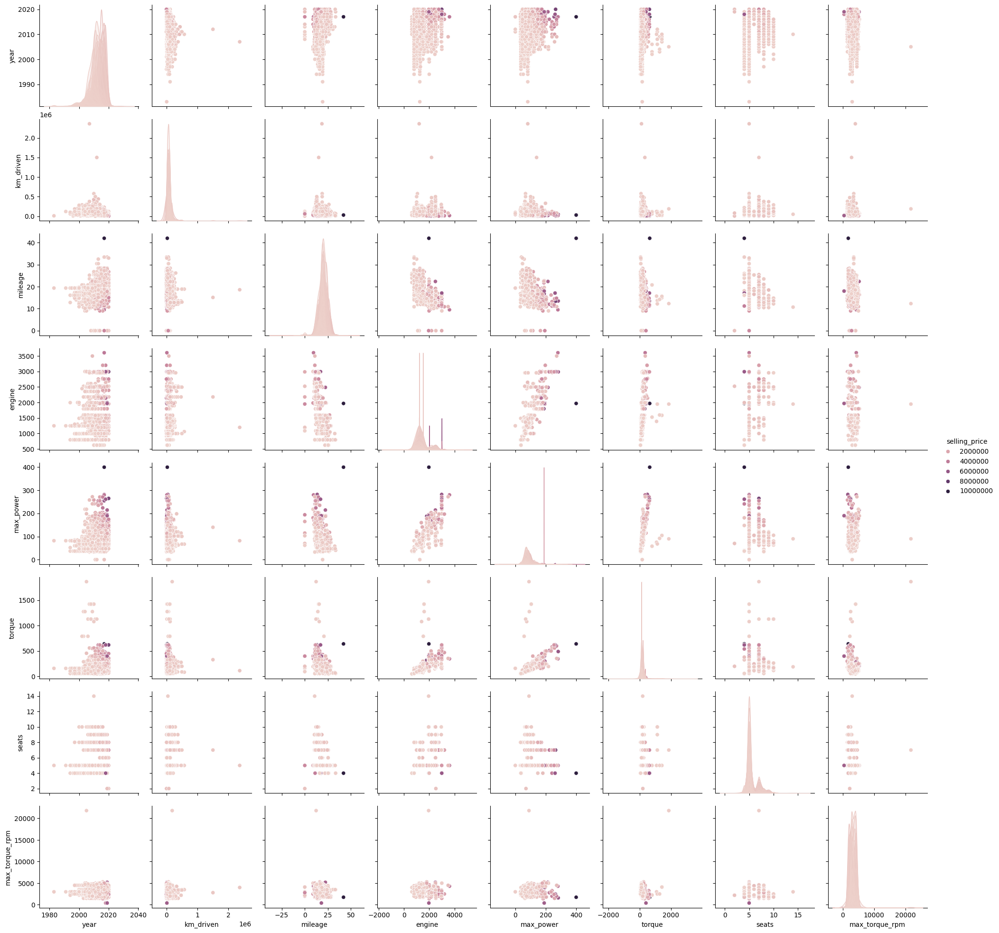

In [ ]:
sns.pairplot(df_train, hue = 'selling_price', diag_kind='kde')

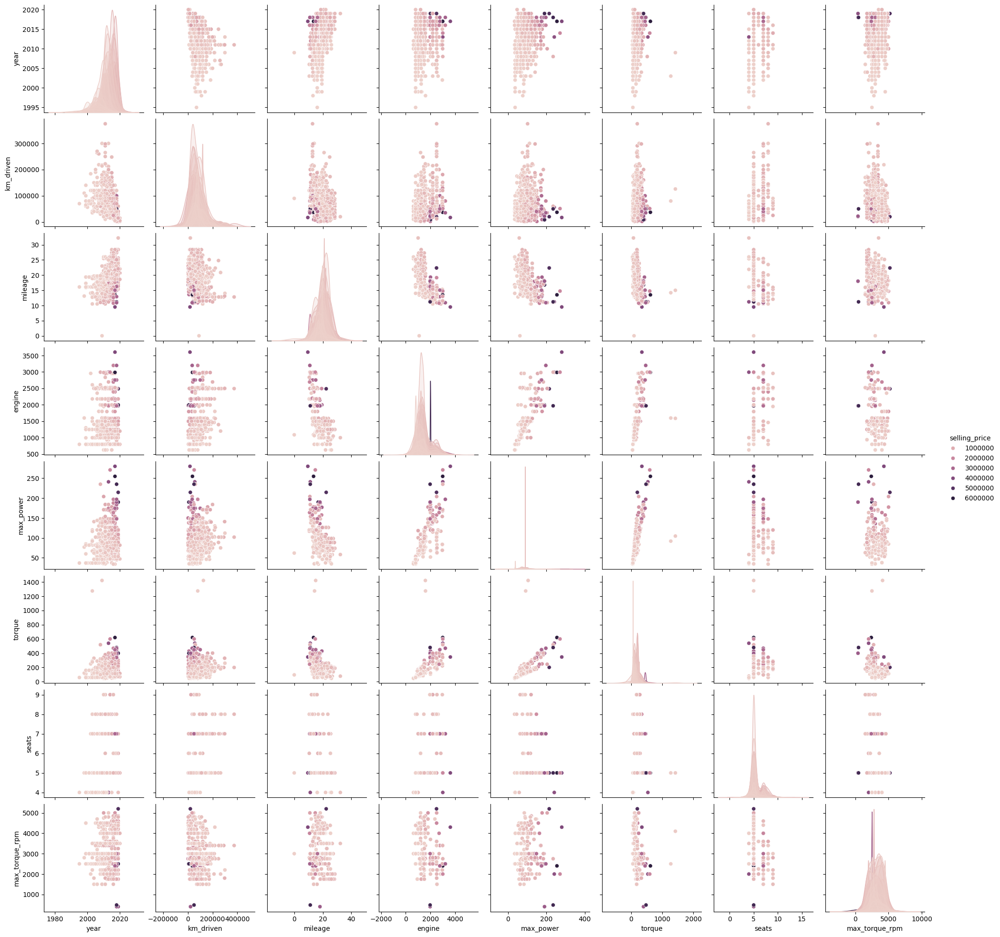

In [ ]:
sns.pairplot(df_test, hue = 'selling_price', diag_kind='kde')

### **Задание 9 (0.5 балла)**

И так, вы выдвинули гипотезы о наличии связи. Теперь давайте оценим эту связь в числах.

**Задание:**
- [ ] Получите значения коэффициента корреляции Пирсона для тренировочного набора данных при помощи `pd.corr()`
- [ ] По полученным корреляциям постройте тепловую карту (`heatmap` из бибилотеки seaborn)

In [ ]:
corr_train = df_train.select_dtypes(include = ['float64', 'int64']).corr(method = 'pearson')

<Axes: >

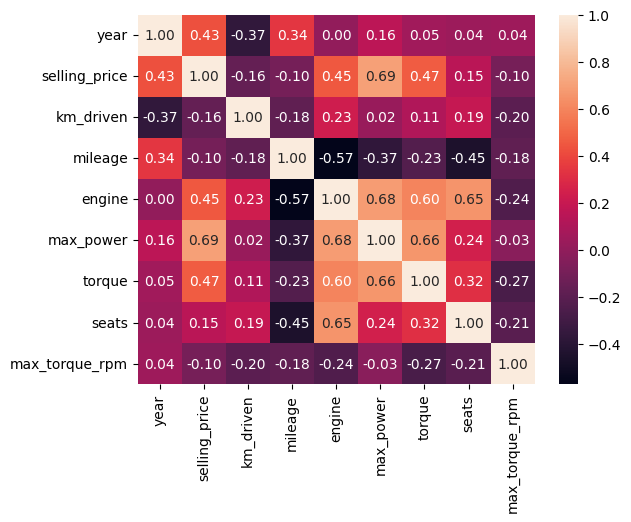

In [ ]:
sns.heatmap(corr_train, annot = True, fmt=".2f")

- [ ] Ответьте на вопросы:
 - Какие 2 признака наименее скоррелированы между собой?
 - Между какими наблюдается довольно сильная положительная линейная зависимость?
 - Правильно ли, опираясь на данные, утверждать, что чем меньше год, тем, скорее всего, больше километров проехала машина к дате продажи?

1. Меньше всего между собой скоррелированы переменные engine и year.
2. Между переменными selling_price и engine, selling_price и max_power, max_power и torque.
3. Да, так можно утверждать, тк между ними отрицательная корреляция.

### **Задание 10 (0.6 балла)**

По умолчанию `pd.corr` возвращает корреляцию Пирсона, говорящую о линейной взаимосвязи. Но зависимости существуют не только линейные! В этой задаче, попробуйте измерить другие способы вычисления корреляций.

- [ ] Реализуйте корреляцию Спирмена/Кендала (на выбор) без использования библиотек (можно пользоваться только `numpy`). Сравните результаты вычисления с библиотечной реализацией
- [ ]

Постройте матрицу корреляции [phik](https://pypi.org/project/phik/)
- [ ] Проинтерпретируйте результаты


In [ ]:
def spearman_corr(x, y):
    n = len(x)

    x_rank = np.argsort(np.argsort(x))
    y_rank = np.argsort(np.argsort(y))


    d = x_rank - y_rank


    return 1 - (6 * np.sum(d**2)) / (n * (n**2 - 1))

In [ ]:
spearman_corr(df_train['max_power'], df_train['selling_price'])

0.6123524312769941

In [ ]:
!pip install phik

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 686.1/686.1 kB 9.2 MB/s eta 0:00:00


In [ ]:
import phik
df_train.select_dtypes(include = ['float64', 'int64']).phik_matrix()

interval columns not set, guessing: ['year', 'selling_price', 'km_driven', 'mileage', 'engine', 'max_power', 'torque', 'seats', 'max_torque_rpm']


,year,selling_price,km_driven,mileage,engine,max_power,torque,seats,max_torque_rpm
year,1.000000,0.219841,0.081574,0.279253,0.213156,0.381639,0.185056,0.288178,0.109431
selling_price,0.219841,1.000000,0.000000,0.649768,0.503682,0.872166,0.686818,0.196447,0.069953
km_driven,0.081574,0.000000,1.000000,0.081625,0.210747,0.000000,0.000000,0.096223,0.000000
mileage,0.279253,0.649768,0.081625,1.000000,0.588155,0.687235,0.377114,0.679979,0.381914
engine,0.213156,0.503682,0.210747,0.588155,1.000000,0.720780,0.609834,0.603400,0.466580
max_power,0.381639,0.872166,0.000000,0.687235,0.720780,1.000000,0.825045,0.569587,0.267321
torque,0.185056,0.686818,0.000000,0.377114,0.609834,0.825045,1.000000,0.365902,0.739869
seats,0.288178,0.196447,0.096223,0.679979,0.603400,0.569587,0.365902,1.000000,0.236222
max_torque_rpm,0.109431,0.069953,0.000000,0.381914,0.466580,0.267321,0.739869,0.236222,1.000000


В целом матрица phik потверждает гипотезу. Из нее видно, что признаки max_power, torque, mileage, engine оказывают самое большое влияние на целевую переменную.

### **Дополнительные визуализации (бонус 0.2 балла)**

Если вам кажется, что мы не попросили вас нарисовать какие-то очень важные зависимости, нарисуйте их и поясните.

Построим box_plot

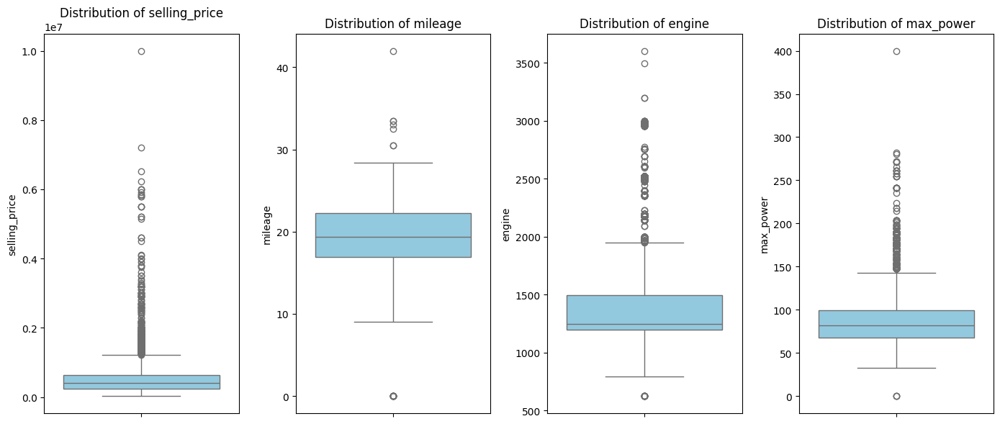

In [ ]:
features = ['selling_price', 'mileage', 'engine', 'max_power']

plt.figure(figsize=(14, 6))
for i, feature in enumerate(features, 1):
    plt.subplot(1, len(features), i)
    sns.boxplot(data=df_train, y=feature, color='skyblue')
    plt.title(f'Distribution of {feature}')
plt.tight_layout()
plt.show()

Из бокс плотов видно, что выбросов достаточно много

# **Часть 2 (1.7 балла) | Модель только на вещественных признаках**

В этой части вам предстоит обучить модель только на вещественных признаках. Почему только на них?

Чем больше признаковое пространство — чем сложнее модель. А чем модель проще — тем лучше для скорости работы и интерпретации признаков.

За задания этой части вы можете набрать 1.7 основных и 0.15 бонусных балла;

### **Задание 11 (0.05 балла)**

Разбейте данные на тренировочный и тестовый наборы. Перед разбиением создайте копию датафрейма, который будет хранить только вещественные признаки и используйте его (то есть категориальные столбцы (все, кроме seats) необходимо удалить).

В переменные y_train и y_test запишите значения целевых переменных.

In [ ]:
df_train_numeric = df_train.select_dtypes(include = ['float64', 'int64']).copy()
df_test_numeric = df_test.select_dtypes(include = ['float64', 'int64']).copy()

In [ ]:
y_train = df_train_numeric['selling_price']
X_train = df_train_numeric.drop('selling_price', axis = 1)

In [ ]:
assert X_train.shape == (5840, 8)

In [ ]:
y_test = df_test_numeric['selling_price']
X_test = df_test_numeric.drop('selling_price', axis = 1)

In [ ]:
assert X_test.shape == (938, 8)

### **Задание 12. (0.2 балла)**

Построим нашу первую модель!
- [ ] Обучите классическую линейную регрессию с дефолтными параметрами. Посчтитайте $R^2$ и $MSE$ для трейна и для теста.
- [ ] Сделайте выводы по значениям метрик качества.

**Примечание:**

Здесь и далее $R^2$ и $MSE$ для трейна и для теста выводите везде, где требуется обучать модели, даже если в явном виде этого не просят. Иначе непонятно, как понять, насколько успешны наши эксперименты.

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score, mean_squared_error as MSE

model = LinearRegression()

model.fit(X_train, y_train)

y_pred_test = model.predict(X_test)
y_pred_train = model.predict(X_train)

In [ ]:
print("MSE train: ",MSE(y_train, y_pred_train))
print("R2 train: ", r2_score(y_train, y_pred_train))

print("MSE test: ",MSE(y_test, y_pred_test))
print("R2 test: ", r2_score(y_test, y_pred_test))

MSE train:  113960744908.2931
R2 train:  0.6024232293518053
MSE test:  131106251004.22925
R2 test:  0.6314248129731126


MSE довольно большое, тк в данных много выбросов, а MSE чувствителен к выбросам. Поэтому в данном случае MSE будет сложно интерпретировать. RMSE для данной MSE будет равен ~ 337 580, что уже более понятно и не выглядит так страшно. R2 показывает, что модель объясняет примерно 63% дисперсии целевой переменной. Для начала этот результат можно считать неплохим, но в целом недостаточным, где нужно больше точности

### **Задание 13 (0.15 балла)**

- [ ] Реализуйте $R^2$ руками. Приведите формулу $R^2$ и объясните каждую компоненту метрики

In [ ]:
def my_r2_score(y_pred, y_true):

    # Среднее значение целевой переменной
    y_mean = np.mean(y_true)

    # Сумма квадратов остатков
    ss_res = np.sum((y_true - y_pred) ** 2)

    # Общая сумма квадратов
    ss_tot = np.sum((y_true - y_mean) ** 2)

    r2 = 1 - (ss_res / ss_tot)
    return r2

In [ ]:
print("Собственная реализация R2 train", my_r2_score(y_pred_train, y_train))
print("Собственная реализация R2 test", my_r2_score(y_pred_test, y_test))

Собственная реализация R2 train 0.6024232293518053
Собственная реализация R2 test 0.6314248129731126


RSS (Residual Sum of Squares) — ошибка модели (разница между реальными и предсказанными значениями).

TSS (Total Sum of Squares) — общая дисперсия целевой переменной (разница между реальными значениями и их средним).

### **Бонус (0.15 балла)**

- [ ] Реализуйте [$\text{adjusted}-R^2$](https://en.wikipedia.org/wiki/Coefficient_of_determination).
- [ ] Объясните, когда применяется $\text{adjusted}-R^2$?

In [ ]:
def adjusted_r2_score(y_pred, y_true, n_predictors):
    y_mean = np.mean(y_true)
    ss_res = np.sum((y_true - y_pred) ** 2)
    ss_tot = np.sum((y_true - y_mean) ** 2)
    r2 = 1 - (ss_res / ss_tot)

    # Размер выборки
    n = len(y_true)

    adjusted_r2 = 1 - ((1 - r2) * (n - 1) / (n - n_predictors - 1))
    return adjusted_r2

In [ ]:
print("Собственная реализация R2 adjusted train", adjusted_r2_score(y_pred_train, y_train, 13))
print("Собственная реализация R2 adjusted test", adjusted_r2_score(y_pred_test, y_test, 13))

Собственная реализация R2 adjusted train 0.6015360858539633
Собственная реализация R2 adjusted test 0.626239231337453


Adjusted R2 подходит, когда добавляются новые признаки. Если при добавлении признаков adjusted R2 уменьшается, то это означает, что новые признаки не улучшают модель.

Так же adjusted R2 штрафует модель за использование ненужных переменных и показывает более реалистичную оценку.

### **Задание 14 (0.05 балла)**

Всегда есть место совершенству. Поэтому давайте попробуем улучшить модель. При помощи стандартизации признаков.

- [ ] Стандартизируйте значения в тренировочных и тестовых данных. Стандартизатор **обучайте только на `train`**.

In [ ]:
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()

X_train_std = scaler.fit_transform(X_train)

X_test_std = scaler.transform(X_test)

In [ ]:
import pickle

In [ ]:
with open("Scaler.pickle", "wb") as f:
    pickle.dump(scaler, f)

In [ ]:
model.fit(X_train_std, y_train)

y_pred_train_std = model.predict(X_train_std)
y_pred_test_std = model.predict(X_test_std)

In [ ]:
print("MSE std train: ",MSE(y_train, y_pred_train_std))
print("R2 std train: ", r2_score(y_train, y_pred_train_std))

print("MSE std test: ",MSE(y_test, y_pred_test_std))
print("R2 std test: ", r2_score(y_test, y_pred_test_std))

MSE std train:  113960744908.29303
R2 std train:  0.6024232293518055
MSE std test:  131106251004.22864
R2 std test:  0.6314248129731143


### **Задание 15 (0.1 балла)**

Хотя стандартизация не помогла сильно прибавить в качестве она открыла возможность интерпретировать важность признаков в модели. Правило интерпретации такое:

Чем больше коэффициент $\beta_i$ по модулю, тем важнее признак.

**Ответьте на вопрос:**

- [ ] Какой признак оказался наиболее информативным в предсказании цены?

In [ ]:
model.coef_

array([166223.72821471, -49200.71507345, -10745.26409433,  20839.07457768,
       329797.08505941,   5989.75278591, -31002.80048724, -63392.54822039])

In [ ]:
model.intercept_

522960.0910958864

Признак max_power оказался самым важным, тк у него наибольший вес

### **Задание 16 (0.25 балла)**

Попробуем улучшить нашу модель с помощью применения регуляризации. Для этого воспльзуемся `Lasso` регрессией.  Кроме того, попробуйте использовать её теоретическое свойство отбора признаков, за счет зануления незначимых коэффициентов.

**Задание:**

- [ ] Обучите Lasso регрессию на тренировочном наборе данных с нормализованными признаками. Оцените её качество
- [ ] Проверьте, занулила ли L1-регуляризация с параметрами по умолчанию какие-нибудь веса? Предположите почему.

In [ ]:
from sklearn.linear_model import Lasso

lasso_reg = Lasso()

lasso_reg.fit(X_train_std, y_train)

y_pred_train_lasso = lasso_reg.predict(X_train_std)
y_pred_test_lasso = lasso_reg.predict(X_test_std)

In [ ]:
print("MSE lasso train: ",MSE(y_train, y_pred_train_lasso))
print("R2 lasso train: ", r2_score(y_train, y_pred_train_lasso))

print("MSE lasso test: ",MSE(y_test, y_pred_test_lasso))
print("R2 lasso test: ", r2_score(y_test, y_pred_test_lasso))

MSE lasso train:  113960744921.84337
R2 lasso train:  0.6024232293045322
MSE lasso test:  131106590227.59473
R2 lasso test:  0.6314238593243398


In [ ]:
lasso_reg.coef_

array([166221.54109866, -49199.77583283, -10741.99200089,  20837.0426401 ,
       329798.5315767 ,   5989.07973615, -30998.81076859, -63390.49173378])

In [ ]:
lasso_reg.intercept_

522960.0910958864

С параметрами по умолчанию L1-регуляризации не удалось занулить веса, поскольку веса имеют большой порядок.

### **Задание 17. Финальный рывок (0.4 балла)**

До этого мы с вами использовали `train` для обучения и `test` для прогнозирования. Но у нас есть ещё одна задача — подобрать оптимальные параметры модели. Для этого используем кросс-валидацию, описанную на семинарах.

Кроме того, выжмем максимум из модификаций регрессии. Построим `ElasticNet`. И сделаем всё по порядку.

**Ваша задача 1:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для Lasso-регрессии. Вам пригодится класс [GridSearchCV](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html).
- [ ] Ответьте на вопросы:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Что значит каждый параметр `param_grid`, который вы заполняли для `GridSearch`? Опишите каждый
 - Какой коэффициент регуляризации у лучшей из перебранных моделей? Занулились ли какие-нибудь из весов при такой регуляризации?

Параметры описал в ячейке

Гридсерчу потребовалось около минуты, чтобы обучить модель

In [ ]:
from sklearn.model_selection import GridSearchCV


params = {'alpha' : np.linspace(0.00001, 1000, 100)}

# первый параметр - модель, второй - словарь параметров, третий - число фолдов, четвертый - метрика, пятый - уровень подробности выходных данных
gs = GridSearchCV(Lasso(max_iter=1000), params, cv=10, scoring="r2", verbose = 5)

gs.fit(X_train, y_train)

Fitting 10 folds for each of 100 candidates, totalling 1000 fits
[CV 1/10] END ......................alpha=1e-05;, score=0.574 total time=   0.0s
[CV 2/10] END ......................alpha=1e-05;, score=0.599 total time=   0.0s
[CV 3/10] END ......................alpha=1e-05;, score=0.660 total time=   0.0s
[CV 4/10] END ......................alpha=1e-05;, score=0.593 total time=   0.0s
[CV 5/10] END ......................alpha=1e-05;, score=0.408 total time=   0.0s
[CV 6/10] END ......................alpha=1e-05;, score=0.668 total time=   0.0s
[CV 7/10] END ......................alpha=1e-05;, score=0.468 total time=   0.0s
[CV 8/10] END ......................alpha=1e-05;, score=0.638 total time=   0.0s
[CV 9/10] END ......................alpha=1e-05;, score=0.557 total time=   0.0s
[CV 10/10] END .....................alpha=1e-05;, score=0.588 total time=   0.0s
[CV 1/10] END ...................alpha=10.10102;, score=0.574 total time=   0.0s
[CV 2/10] END ...................alpha=10.10

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.173e+13, tolerance: 1.674e+11
  model = cd_fast.enet_coordinate_descent(


GridSearchCV(cv=10, estimator=Lasso(),
             param_grid={'alpha': array([1.0000000e-05, 1.0101020e+01, 2.0202030e+01, 3.0303040e+01,
       4.0404050e+01, 5.0505060e+01, 6.0606070e+01, 7.0707080e+01,
       8.0808090e+01, 9.0909100e+01, 1.0101011e+02, 1.1111112e+02,
       1.2121213e+02, 1.3131314e+02, 1.4141415e+02, 1.5151516e+02,
       1.6161617e+02, 1.7171718e+02, 1.8181819e+02, 1.9191920e+02,
       2.0202...
       7.6767677e+02, 7.7777778e+02, 7.8787879e+02, 7.9797980e+02,
       8.0808081e+02, 8.1818182e+02, 8.2828283e+02, 8.3838384e+02,
       8.4848485e+02, 8.5858586e+02, 8.6868687e+02, 8.7878788e+02,
       8.8888889e+02, 8.9898990e+02, 9.0909091e+02, 9.1919192e+02,
       9.2929293e+02, 9.3939394e+02, 9.4949495e+02, 9.5959596e+02,
       9.6969697e+02, 9.7979798e+02, 9.8989899e+02, 1.0000000e+03])},
             scoring='r2', verbose=5)

Text(0, 0.5, 'Score')

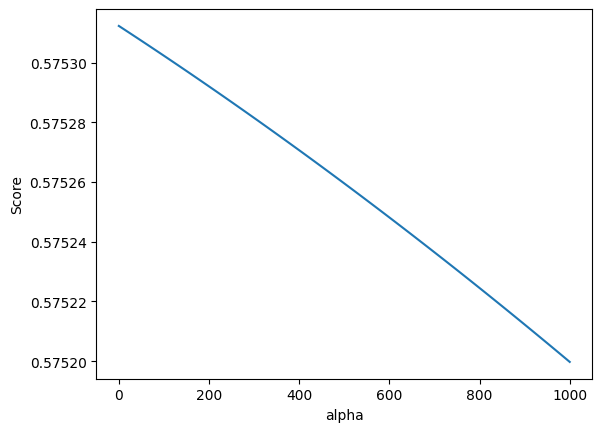

In [ ]:
plt.plot(params['alpha'], gs.cv_results_["mean_test_score"])
plt.xlabel("alpha")
plt.ylabel("Score")

In [ ]:
print(gs.best_score_) # качество наилучшей модели (с оптимальными гиперпараметрами)
print(gs.best_params_) # оптимальные гиперпараметры

0.575312259817851
{'alpha': 1e-05}


In [ ]:
weights = abs(gs.best_estimator_.coef_)
feature_weights = pd.DataFrame({'Feature': X_train.columns, 'Weight': weights})
feature_weights.sort_values(by='Weight')

,Feature,Weight
1,km_driven,0.819111
3,engine,42.912197
5,torque,55.998219
7,max_torque_rpm,69.534221
2,mileage,2696.000132
4,max_power,10424.177119
6,seats,31562.728257
0,year,40589.186150


В этот раз вес km_driven практически занулился

**Ваша задача 2:**

- [ ] Перебором по сетке (c 10-ю фолдами) подберите оптимальные параметры для [ElasticNet](https://scikit-learn.org/stable/modules/generated/sklearn.linear_model.ElasticNet.html) регрессии.
- [ ] Ответьте на вопрос:
 - Сколько грид-сёрчу пришлось обучать моделей?
 - Какие гиперпараметры соответствуют лучшей (по выбранной метрике качества) из перебранных моделей?

Гридсерчу потребовалось около минуты, чтобы обучить модель


In [ ]:
from sklearn.linear_model import ElasticNet


from sklearn.model_selection import GridSearchCV


params = {'alpha' : np.linspace(0.1, 1, 100),'l1_ratio': np.linspace(0.1, 1, 10)}


gs = GridSearchCV(ElasticNet(), params, cv=10, scoring="r2", verbose = 5)

gs.fit(X_train, y_train)

Выходные данные были обрезаны до нескольких последних строк (5000).
[CV 1/10] END alpha=0.5545454545454546, l1_ratio=0.1;, score=0.575 total time=   0.0s
[CV 2/10] END alpha=0.5545454545454546, l1_ratio=0.1;, score=0.596 total time=   0.0s
[CV 3/10] END alpha=0.5545454545454546, l1_ratio=0.1;, score=0.658 total time=   0.0s
[CV 4/10] END alpha=0.5545454545454546, l1_ratio=0.1;, score=0.594 total time=   0.0s
[CV 5/10] END alpha=0.5545454545454546, l1_ratio=0.1;, score=0.396 total time=   0.0s
[CV 6/10] END alpha=0.5545454545454546, l1_ratio=0.1;, score=0.667 total time=   0.0s
[CV 7/10] END alpha=0.5545454545454546, l1_ratio=0.1;, score=0.468 total time=   0.0s
[CV 8/10] END alpha=0.5545454545454546, l1_ratio=0.1;, score=0.641 total time=   0.0s
[CV 9/10] END alpha=0.5545454545454546, l1_ratio=0.1;, score=0.555 total time=   0.0s
[CV 10/10] END alpha=0.5545454545454546, l1_ratio=0.1;, score=0.587 total time=   0.0s
[CV 1/10] END alpha=0.5545454545454546, l1_ratio=0.2;, score=0.575 tota

GridSearchCV(cv=10, estimator=ElasticNet(),
             param_grid={'alpha': array([0.1       , 0.10909091, 0.11818182, 0.12727273, 0.13636364,
       0.14545455, 0.15454545, 0.16363636, 0.17272727, 0.18181818,
       0.19090909, 0.2       , 0.20909091, 0.21818182, 0.22727273,
       0.23636364, 0.24545455, 0.25454545, 0.26363636, 0.27272727,
       0.28181818, 0.29090909, 0.3       , 0.30909091, 0.31818182,
       0.32727273, 0.33636364, 0.345...
       0.73636364, 0.74545455, 0.75454545, 0.76363636, 0.77272727,
       0.78181818, 0.79090909, 0.8       , 0.80909091, 0.81818182,
       0.82727273, 0.83636364, 0.84545455, 0.85454545, 0.86363636,
       0.87272727, 0.88181818, 0.89090909, 0.9       , 0.90909091,
       0.91818182, 0.92727273, 0.93636364, 0.94545455, 0.95454545,
       0.96363636, 0.97272727, 0.98181818, 0.99090909, 1.        ]),
                         'l1_ratio': array([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. ])},
             scoring='r2', verbose=5)

Лучшие параметры

In [ ]:
print(gs.best_score_) # качество наилучшей модели (с оптимальными гиперпараметрами)
print(gs.best_params_) # оптимальные гиперпараметры

0.5753122499590994
{'alpha': 0.1, 'l1_ratio': 1.0}


In [ ]:
y_pred_train_elastic = gs.predict(X_train)
y_pred_test_elastic = gs.predict(X_test)

In [ ]:
print("MSE lasso train: ",MSE(y_train, y_pred_train_elastic))
print("R2 lasso train: ", r2_score(y_train, y_pred_train_elastic))

print("MSE lasso test: ",MSE(y_test, y_pred_test_elastic))
print("R2 lasso test: ", r2_score(y_test, y_pred_test_elastic))

MSE lasso train:  113960744908.32376
R2 lasso train:  0.6024232293516983
MSE lasso test:  131106257841.7391
R2 lasso test:  0.6314247937510201


### **Задание 18 (0.35 балла)**

И так, вы обучили все варианты регуляризаций, доступные в sklearn, но не все, что мы обсудили на занятии! И следующее задание о забытой - $L0$ регуляризации.


**Ваша задача:**>
- [ ] Реализуйте модель с $L0$-регуляризаицей.
- [ ] Обучите модель на данных и проанализируйте результат, экспериментируя с коэффициенитом регуляризации
- [ ] Проанализируйте результаты обучения

**Важно:**

Вопреки тому, что L0 не реализована в стандартных пакетах, концепция данной регуляризации не является мертвой. Она может встречаться в [статьях](https://arxiv.org/abs/1712.01312) и экспериментах.



In [ ]:
def l0(X_train, y_train, X_test, y_test, alphas):
    coefs = []
    for alpha in alphas:
        model = Lasso(alpha=alpha)
        model.fit(X_train, y_train)
        coefs.append(model.coef_)

    return coefs

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_coordinate_descent.py:697: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.173e+13, tolerance: 1.674e+11
  model = cd_fast.enet_coordinate_descent(


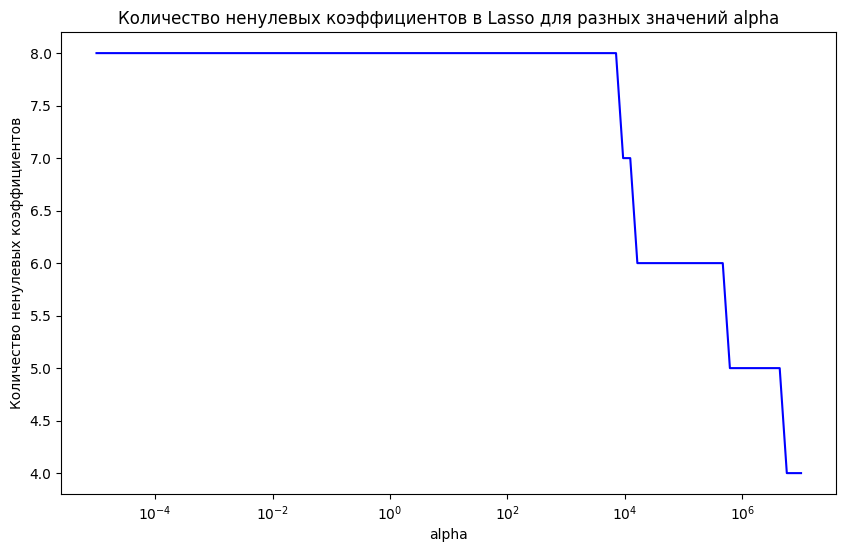

In [ ]:
alphas = np.logspace(-5, 7, 100)
coefs = l0(X_train, y_train, X_test, y_test, alphas)

nonzero_coefs = [np.count_nonzero(coef) for coef in coefs]

plt.figure(figsize=(10, 6))
plt.plot(alphas, nonzero_coefs, label='Количество ненулевых коэффициентов', color='blue')
plt.xscale('log')
plt.xlabel('alpha')
plt.ylabel('Количество ненулевых коэффициентов')
plt.title('Количество ненулевых коэффициентов в Lasso для разных значений alpha')
plt.show()

С ростом коэффициента альфа, модель начинает сильнее штрафовать менее важные признаки. В итоге зануляет их коэффициенты.

# **Часть 3 (0.5 балла) | Добавляем категориальные фичи**

Попробуем для улучшения модели дать ей больше признаков. Добавим категориальные фичи.

За эту часть можно набрать 0.5 основных балла.



### **Задание 19 (0.1 балла)**

Проанализируйте столбец `name`. Очевидно, что эта переменная является категориальной, однако категорий в ней много.

- [ ] Предобработайте столбец `name`, чтобы избежать его удаления

In [ ]:
df_train['name'].nunique()

1924

In [ ]:
df_train['name']

,name
0,Maruti Swift Dzire VDI
1,Skoda Rapid 1.5 TDI Ambition
2,Hyundai i20 Sportz Diesel
3,Maruti Swift VXI BSIII
4,Hyundai Xcent 1.2 VTVT E Plus
...,...
5835,Hyundai Santro Xing GLS
5836,Maruti Wagon R VXI BS IV with ABS
5837,Hyundai i20 Magna
5838,Hyundai Verna CRDi SX


Выполнил предобработку name

In [ ]:
df_train['name'] = df_train['name'].str.lower()


In [ ]:
df_train['name'] = df_train['name'].str.strip()
df_train['name'] = df_train['name'].str.replace(r'\s+', ' ', regex=True)

In [ ]:
stop_words = ['vdi', 'bsiii', 'tdi', 'vtvt', 'diesel', 'petrol', 'electric', 'ambition', 'sportz']

df_train['name'] = df_train['name'].apply(lambda x: ' '.join([word for word in x.split() if word not in stop_words]))

In [ ]:
# Оставляю только марку и модель
df_train['name'] = df_train['name'].apply(lambda x: ' '.join(x.split()[:2]))

In [ ]:
name_counts = df_train['name'].value_counts()

# Заменяем редкие категории
df_train['name'] = df_train['name'].apply(lambda x: x if name_counts[x] >= 5 else 'other')

In [ ]:
df_train

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,max_torque_rpm,power_per_engine
0,maruti swift,2014,450000,145500,Diesel,Individual,Manual,First Owner,23.40,1248,74.00,190.00,5,2000.0,0.059295
1,skoda rapid,2014,370000,120000,Diesel,Individual,Manual,Second Owner,21.14,1498,103.52,250.00,5,2500.0,0.069105
2,hyundai i20,2010,225000,127000,Diesel,Individual,Manual,First Owner,23.00,1396,90.00,219.52,5,2750.0,0.064470
3,maruti swift,2007,130000,120000,Petrol,Individual,Manual,First Owner,16.10,1298,88.20,112.70,5,4500.0,0.067951
4,hyundai xcent,2017,440000,45000,Petrol,Individual,Manual,First Owner,20.14,1197,81.86,113.75,5,4000.0,0.068388
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5835,hyundai santro,2008,120000,191000,Petrol,Individual,Manual,First Owner,17.92,1086,62.10,96.10,5,3000.0,0.057182
5836,maruti wagon,2013,260000,50000,Petrol,Individual,Manual,Second Owner,18.90,998,67.10,90.00,5,3500.0,0.067234
5837,hyundai i20,2013,320000,110000,Petrol,Individual,Manual,First Owner,18.50,1197,82.85,113.70,5,4000.0,0.069215
5838,hyundai verna,2007,135000,119000,Diesel,Individual,Manual,Fourth & Above Owner,16.80,1493,110.00,235.20,5,2750.0,0.073677


In [ ]:
df_test_copy = df_test.copy()
df_test_copy['name'] = df_test_copy['name'].str.lower()
df_test_copy['name'] = df_test_copy['name'].str.strip()
df_test_copy['name'] = df_test_copy['name'].str.replace(r'\s+', ' ', regex=True)
stop_words = ['vdi', 'bsiii', 'tdi', 'vtvt', 'diesel', 'petrol', 'electric', 'ambition', 'sportz']

df_test_copy['name'] = df_test_copy['name'].apply(lambda x: ' '.join([word for word in x.split() if word not in stop_words]))
# Оставляю только марку и модель
df_test_copy['name'] = df_test_copy['name'].apply(lambda x: ' '.join(x.split()[:2]))
name_counts = df_test_copy['name'].value_counts()

# Заменяем редкие категории
df_test_copy['name'] = df_test_copy['name'].apply(lambda x: x if name_counts[x] >= 5 else 'other')

In [ ]:
df_train['name'].nunique()

126

In [ ]:
X_train_cat = df_train.drop(['selling_price'], axis=1)
X_test_cat = df_test.drop(['selling_price'], axis=1)

In [ ]:
assert X_train_cat.shape == (5840, 13)

In [ ]:
X_train_cat.describe(include='object')

,name,fuel,seller_type,transmission,owner
count,5840,5840,5840,5840,5840
unique,126,4,3,2,5
top,maruti swift,Diesel,Individual,Manual,First Owner
freq,558,3177,5223,5336,3603


### **Задание 20 (0.1 балла)**

- [ ] Закодируйте категориалльные фичи и ``seats`` методом OneHot-кодирования.

In [ ]:
from sklearn.preprocessing import OneHotEncoder # или можно использовать get_dummies из библиотеки pandas

X_train_cat = pd.get_dummies(X_train_cat, columns=['name', 'fuel', 'seller_type', 'transmission', 'owner', 'seats'], drop_first=True)

In [ ]:
from sklearn.preprocessing import OneHotEncoder
import pickle
categorical_columns = ['name', 'fuel', 'seller_type', 'transmission', 'owner', 'seats']

encoder = OneHotEncoder(drop="first", sparse_output=False)

encoded_data = encoder.fit_transform(X_train_cat[categorical_columns])

with open("Encoder.pickle", "wb") as f:
    pickle.dump(encoder, f)

encoded_columns = encoder.get_feature_names_out(categorical_columns)

encoded_df = pd.DataFrame(encoded_data, columns=encoded_columns, index=X_train_cat.index)

X_train_cat = pd.concat([X_train_cat.drop(columns=categorical_columns), encoded_df], axis=1)

In [ ]:
X_train_cat

,year,km_driven,mileage,engine,max_power,torque,max_torque_rpm,name_audi a6,name_audi q3,name_audi q7,...,owner_Test Drive Car,owner_Third Owner,seats_4,seats_5,seats_6,seats_7,seats_8,seats_9,seats_10,seats_14
0,2014,145500,23.40,1248,74.00,190.00,2000.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,2014,120000,21.14,1498,103.52,250.00,2500.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2010,127000,23.00,1396,90.00,219.52,2750.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
3,2007,120000,16.10,1298,88.20,112.70,4500.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
4,2017,45000,20.14,1197,81.86,113.75,4000.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5835,2008,191000,17.92,1086,62.10,96.10,3000.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
5836,2013,50000,18.90,998,67.10,90.00,3500.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
5837,2013,110000,18.50,1197,82.85,113.70,4000.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
5838,2007,119000,16.80,1493,110.00,235.20,2750.0,0.0,0.0,0.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0


### **Задание 21 (0.2 балла)**

OHE — базовый алгоритм преобразования категориальных признаков, но и с ним нужно быть аккуратными.

**Ответьте на вопросы:**


* Как корректно работать с OHE преобразованием?
* Почему мы удаляем один столбец?
* Пусть из $n$ признаков мы получили $n-1$ столбец, из которых $k < n -1$ оказались не важными по весам модели. Корректно ли их удалить?

1. Для корректной работы с OHE лучше уменьшать размерность
2. Удаление одного столбца предотвращает проблему мультиколлинеарности
3. Да, удаление малозначимых признаков корректно, если не приводит к потере важной информации

### **Задание 22 (0.1 балла)**
Повторим то, что делали на прошлом шаге для моделей на вещественных признаках, однако теперь с моделью `Ridge`.


**Ваша задача:**
- [ ] Переберите параметр регуляризации `alpha` для гребневой (ridge) регрессии с помощью класса `GridSearchCV` В качестве параметров при объявлении GridSearchCV кроме модели укажите метрику качества $R^2$. Кроссвалидируйтесь по 10-ти фолдам.
- [ ] Ответье на вопрос: Удалось ли улучшить качество прогнозов?

In [ ]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV

params = {'alpha' : np.linspace(0.00001, 1000, 100)}

gs = GridSearchCV(Ridge(), params, cv=10, scoring="r2", verbose = 5)

gs.fit(X_train_cat, y_train)


Fitting 10 folds for each of 100 candidates, totalling 1000 fits
[CV 1/10] END ......................alpha=1e-05;, score=0.695 total time=   0.0s
[CV 2/10] END ......................alpha=1e-05;, score=0.793 total time=   0.0s
[CV 3/10] END ......................alpha=1e-05;, score=0.775 total time=   0.0s
[CV 4/10] END ......................alpha=1e-05;, score=0.692 total time=   0.0s
[CV 5/10] END ......................alpha=1e-05;, score=0.598 total time=   0.0s


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_ridge.py:216: LinAlgWarning: Ill-conditioned matrix (rcond=5.04183e-19): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


[CV 6/10] END ......................alpha=1e-05;, score=0.817 total time=   0.0s
[CV 7/10] END ......................alpha=1e-05;, score=0.650 total time=   0.0s
[CV 8/10] END ......................alpha=1e-05;, score=0.680 total time=   0.0s
[CV 9/10] END ......................alpha=1e-05;, score=0.782 total time=   0.1s
[CV 10/10] END .....................alpha=1e-05;, score=0.678 total time=   0.1s
[CV 1/10] END ...................alpha=10.10102;, score=0.701 total time=   0.1s
[CV 2/10] END ...................alpha=10.10102;, score=0.765 total time=   0.1s
[CV 3/10] END ...................alpha=10.10102;, score=0.775 total time=   0.1s
[CV 4/10] END ...................alpha=10.10102;, score=0.676 total time=   0.0s
[CV 5/10] END ...................alpha=10.10102;, score=0.591 total time=   0.2s
[CV 6/10] END ...................alpha=10.10102;, score=0.796 total time=   0.0s
[CV 7/10] END ...................alpha=10.10102;, score=0.571 total time=   0.0s
[CV 8/10] END ..............

In [ ]:
print(gs.best_score_)
print(gs.best_params_)

0.7159583873225299
{'alpha': 1e-05}


Значение качества прогнозов удалось улучшить - r2 изменилось с ~0.61 на ~0.71

# **Часть 4 - бонусная (1 балл) | Feature Engineering**

В этой части домашнего задания вам предлагается проявить свою креативность для улучшения прогноза модели. Любые другие модели, кроме различных форм линейной (или полиномиальной) регресси, использовать запрещается. А значит, придется работать с признаками

**Что можно попробовать сделать?** (каждый пункт по 0.4 балла, но не больше 2-х баллов в сумме)

1.   *Сгенерировать новые признаки на основе уже существующих:*
    * посчитать произведения // частные признаков (кажется, что посчитать число "лошадей" на литр объема может быть полезно);
    * имеет смысл обратить внимание на визуализации в части с EDA (к примеру, зависимость цены от года выглядит квадратичной, а не линейной; значит, квадрат года нам, скорее всего, принесет больше пользы)

2.   *Добыть новые признаки:*
    * имеем название автомобиля, которое никак не используем (можно спарсить инфу о классе автомобиля или каких-то специфических опциях)
    * можно добавить пороговые признаки вроде "владелец третий или больше" и объединить признаки в некоторые осмысленные правила, например "первый или второй владелец и продавец официальный дилер" (подбирать пороги удобно по диаграммам рассеяния)

3.   *Поработать с уже имеющимися:*
    * далеко не факт, что заполнить пропуск медианой было лучшей идеей (как минимум, можно добавить dummy-столбец для модели, сигнализирующий, что раньше на месте медианы был пропуск -- там где он был, конечно); попробуйте другие способы филлинга;
    * мы не анализировали, есть ли в данных выбросы => никак выбросы не обрабатывали; наиболее простым и, тем не менее, довольно полезным вариантом нахождения выбросов могут послужить boxplot'ы для каждого столбца; что делать с выбросами думайте сами :) -- вариантов довольно много
    * мы толком не смотрели на таргет сам по себе; в нем тоже могут быть неожиданности -- стоит хотя бы проверить
    * можно заметить, что некоторые признаки распределены совсем не нормально; возможно их стоит отлогарифмировать

И так далее...

Feel Free to Try!

Колонку name я предобратал на предыдущих этапах. Поэтому сейчас перейду к выбросам

In [ ]:
# Создание новых признаков

# число "лошадей" на литр объема
df_train['power_per_engine'] = df_train['max_power']/df_train['engine']
df_test['power_per_engine'] = df_test['max_power']/df_test['engine']

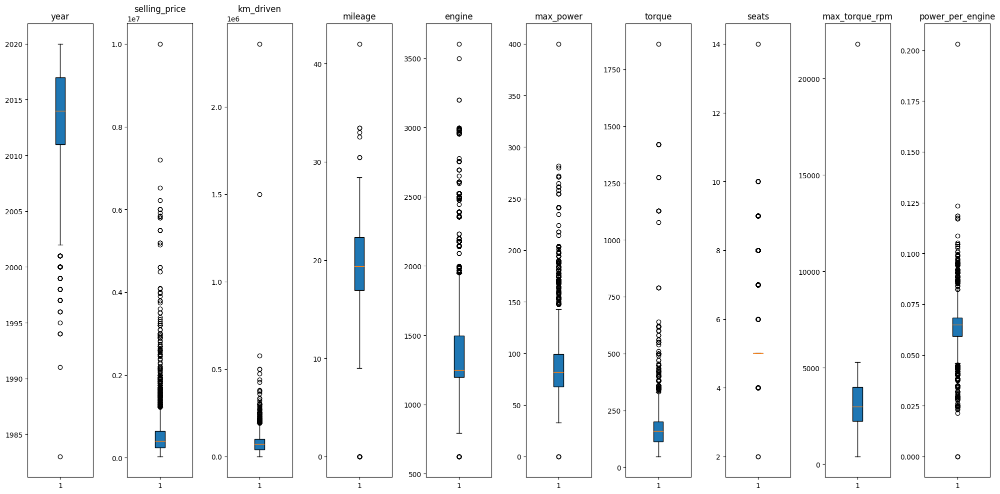

In [ ]:
columns = list(df_train.select_dtypes('number').columns)

fig, ax = plt.subplots(nrows=1, ncols=len(columns), figsize=(20, 10))

bplot = []

for i in range(len(columns)):
    bplot.append(
        ax[i].boxplot(
            df_train[columns[i]],
            vert=True,
            patch_artist=True,
        )
    )
    ax[i].set_title(f'{columns[i]}')
plt.tight_layout()
plt.show()

Из бокс плотов видны явные выбросы - ошибки

In [ ]:
df_train[df_train['torque'] > 1000]

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,max_torque_rpm,power_per_engine
498,tata sumo,2011,175000,20000,Diesel,Individual,Manual,First Owner,12.2,1948,68.00,1127.0,10,2500.0,0.034908
920,maruti sx4,2007,160000,120000,Petrol,Individual,Manual,Second Owner,15.0,1586,104.68,1421.0,5,4100.0,0.066003
1616,tata sumo,2012,200000,67500,Diesel,Individual,Manual,First Owner,12.2,1948,68.00,1127.0,10,2500.0,0.034908
1787,maruti sx4,2010,300000,22000,Petrol,Individual,Manual,First Owner,15.0,1586,104.68,1421.0,5,4100.0,0.066003
1809,maruti sx4,2008,150000,89000,Petrol,Individual,Manual,Second Owner,15.6,1586,104.68,1421.0,5,4100.0,0.066003
1898,ford ikon,2009,180000,70000,Petrol,Individual,Manual,Second Owner,14.2,1597,92.00,1274.0,5,2500.0,0.057608
2242,ford ikon,2003,150000,40000,Petrol,Individual,Manual,Third Owner,14.2,1597,92.00,1274.0,5,2500.0,0.057608
3115,maruti sx4,2009,150000,110000,Petrol,Individual,Manual,First Owner,15.0,1586,104.68,1421.0,5,4100.0,0.066003
3187,maruti sx4,2007,125000,120000,Petrol,Individual,Manual,Third Owner,15.0,1586,104.68,1421.0,5,4100.0,0.066003
3252,tata sumo,2006,130000,74000,Diesel,Individual,Manual,First Owner,13.7,1948,68.00,1127.0,7,2500.0,0.034908


In [ ]:
df_test[df_test['torque'] > 1000]

,name,year,selling_price,km_driven,fuel,seller_type,transmission,owner,mileage,engine,max_power,torque,seats,max_torque_rpm,power_per_engine
108,Maruti SX4 Vxi BSIII,2009,250000,125876,Petrol,Individual,Manual,Second Owner,15.0,1586,104.68,1421.0,5,4100.0,0.066003
397,Ford Ikon 1.6 Really Sport,2003,130000,80000,Petrol,Individual,Manual,Third Owner,14.2,1597,92.00,1274.0,5,2500.0,0.057608


Из данных видно, что это маломощные авто, поэтому для них можно заменить torque на медианное значение.

In [ ]:
df_train[df_train['torque'] > 1000].replace(df_train['torque'].median(), inplace = True)
df_test[df_test['torque'] > 1000].replace(df_train['torque'].median(), inplace = True)

<ipython-input-28-d48e3162b430>:1: FutureWarning: DataFrame.replace without 'value' and with non-dict-like 'to_replace' is deprecated and will raise in a future version. Explicitly specify the new values instead.
  df_train[df_train['torque'] > 1000].replace(df_train['torque'].median(), inplace = True)
<ipython-input-28-d48e3162b430>:2: FutureWarning: DataFrame.replace without 'value' and with non-dict-like 'to_replace' is deprecated and will raise in a future version. Explicitly specify the new values instead.
  df_test[df_test['torque'] > 1000].replace(df_train['torque'].median(), inplace = True)


Так же заменим выброс из max_torque_rpm

In [ ]:
df_train[df_train['max_torque_rpm'] > 10000].replace(df_train['max_torque_rpm'].median(), inplace = True)
df_test[df_test['max_torque_rpm'] > 10000].replace(df_train['max_torque_rpm'].median(), inplace = True)

<ipython-input-29-12653365503c>:1: FutureWarning: DataFrame.replace without 'value' and with non-dict-like 'to_replace' is deprecated and will raise in a future version. Explicitly specify the new values instead.
  df_train[df_train['max_torque_rpm'] > 10000].replace(df_train['max_torque_rpm'].median(), inplace = True)
<ipython-input-29-12653365503c>:2: FutureWarning: DataFrame.replace without 'value' and with non-dict-like 'to_replace' is deprecated and will raise in a future version. Explicitly specify the new values instead.
  df_test[df_test['max_torque_rpm'] > 10000].replace(df_train['max_torque_rpm'].median(), inplace = True)


Заменим нулевые значения медианами

In [ ]:
df_train[df_train['max_power'] == 0].replace(df_train['max_power'].median(), inplace = True)
df_test[df_test['max_power'] == 0].replace(df_train['max_power'].median(), inplace = True)

<ipython-input-30-e0a1d05fb88c>:1: FutureWarning: DataFrame.replace without 'value' and with non-dict-like 'to_replace' is deprecated and will raise in a future version. Explicitly specify the new values instead.
  df_train[df_train['max_power'] == 0].replace(df_train['max_power'].median(), inplace = True)
<ipython-input-30-e0a1d05fb88c>:2: FutureWarning: DataFrame.replace without 'value' and with non-dict-like 'to_replace' is deprecated and will raise in a future version. Explicitly specify the new values instead.
  df_test[df_test['max_power'] == 0].replace(df_train['max_power'].median(), inplace = True)


Теперь обновим новый признак

In [ ]:
df_train['power_per_engine'] = df_train['max_power']/df_train['engine']
df_test['power_per_engine'] = df_test['max_power']/df_test['engine']

In [ ]:
df_train_numeric = df_train.select_dtypes(include = ['float64', 'int64']).copy()
df_test_numeric = df_test.select_dtypes(include = ['float64', 'int64']).copy()

In [ ]:
X_train_new = df_train.drop(['selling_price'], axis=1)
X_test_new = df_test_copy.drop(['selling_price'], axis=1)

In [ ]:
categorical_columns = ['name', 'fuel', 'seller_type', 'transmission', 'owner', 'seats']

encoder = OneHotEncoder(drop="first", sparse_output=False)

encoder.fit(X_train_new[categorical_columns])


encoded_data_train = encoder.transform(X_train_new[categorical_columns])
encoded_data_test = encoder.transform(X_test_new[categorical_columns])

with open("Encoder.pickle", "wb") as f:
    pickle.dump(encoder, f)

encoded_columns = encoder.get_feature_names_out(categorical_columns)

encoded_df_train = pd.DataFrame(encoded_data_train, columns=encoded_columns, index=X_train_new.index)
encoded_df_test = pd.DataFrame(encoded_data_test, columns=encoded_columns, index=X_test_new.index)

X_train_new = pd.concat([X_train_new.drop(columns=categorical_columns), encoded_df_test], axis=1)
X_test_new = pd.concat([X_test_new.drop(columns=categorical_columns), encoded_df_test], axis=1)

In [ ]:
from sklearn.preprocessing import StandardScaler
numeric_columns = ['year', 'km_driven', 'mileage', 'engine', 'max_power', 'torque', 'max_torque_rpm', 'power_per_engine']

scaler = StandardScaler()
scaler.fit(X_train_new[numeric_columns])
X_train_new[numeric_columns] = scaler.transform(X_train_new[numeric_columns])
X_test_new[numeric_columns] = scaler.transform(X_test_new[numeric_columns])

In [ ]:
with open("Scaler.pickle", "wb") as f:
    pickle.dump(scaler, f)

In [ ]:
params = {'alpha' : np.linspace(0.00001, 1000, 1000)}

gs = GridSearchCV(Ridge(), params, cv=10, scoring='r2', verbose= 5)

gs.fit(X_train_new, y_train)

Выходные данные были обрезаны до нескольких последних строк (5000).
[CV 1/10] END ..........alpha=500.5005054954954;, score=0.547 total time=   0.0s
[CV 2/10] END ..........alpha=500.5005054954954;, score=0.603 total time=   0.0s
[CV 3/10] END ..........alpha=500.5005054954954;, score=0.657 total time=   0.0s
[CV 4/10] END ..........alpha=500.5005054954954;, score=0.586 total time=   0.0s
[CV 5/10] END ..........alpha=500.5005054954954;, score=0.453 total time=   0.0s
[CV 6/10] END ..........alpha=500.5005054954954;, score=0.651 total time=   0.0s
[CV 7/10] END ..........alpha=500.5005054954954;, score=0.472 total time=   0.0s
[CV 8/10] END ..........alpha=500.5005054954954;, score=0.640 total time=   0.0s
[CV 9/10] END ..........alpha=500.5005054954954;, score=0.578 total time=   0.0s
[CV 10/10] END .........alpha=500.5005054954954;, score=0.583 total time=   0.0s
[CV 1/10] END .........alpha=501.50150648648645;, score=0.547 total time=   0.0s
[CV 2/10] END .........alpha=501.50150648

GridSearchCV(cv=10, estimator=Ridge(),
             param_grid={'alpha': array([1.00000000e-05, 1.00101099e+00, 2.00201198e+00, 3.00301297e+00,
       4.00401396e+00, 5.00501495e+00, 6.00601595e+00, 7.00701694e+00,
       8.00801793e+00, 9.00901892e+00, 1.00100199e+01, 1.10110209e+01,
       1.20120219e+01, 1.30130229e+01, 1.40140239e+01, 1.50150249e+01,
       1.60160259e+01, 1.70170268e+01, 1.80180278e+01, 1...
       9.76976977e+02, 9.77977978e+02, 9.78978979e+02, 9.79979980e+02,
       9.80980981e+02, 9.81981982e+02, 9.82982983e+02, 9.83983984e+02,
       9.84984985e+02, 9.85985986e+02, 9.86986987e+02, 9.87987988e+02,
       9.88988989e+02, 9.89989990e+02, 9.90990991e+02, 9.91991992e+02,
       9.92992993e+02, 9.93993994e+02, 9.94994995e+02, 9.95995996e+02,
       9.96996997e+02, 9.97997998e+02, 9.98998999e+02, 1.00000000e+03])},
             scoring='r2', verbose=5)

In [ ]:
print(gs.best_score_)
print(gs.best_params_)

0.5831954967548622
{'alpha': 18.01802783783784}


In [ ]:
y_pred_train = gs.predict(X_train_new)
y_pred_test = gs.predict(X_test_new)

In [ ]:
print(f'MSE для трейна равно {MSE(y_train, y_pred_train):.4f}')
print(f'MSE для теста равно {MSE(y_test, y_pred_test):.4f}')

print(f'r2 для трейна равно {r2_score(y_train, y_pred_train):.10f}')
print(f'r2 для теста равно {r2_score(y_test, y_pred_test):.10f}')

MSE для трейна равно 111989918568.7831
MSE для теста равно 128133079215.9249
r2 для трейна равно 0.6092988844
r2 для теста равно 0.6397832043


Пока что улучшить качество не удалось. Можете подсказать почему?

А если посмотреть на распределение целевой переменной...

<Axes: xlabel='selling_price', ylabel='Density'>

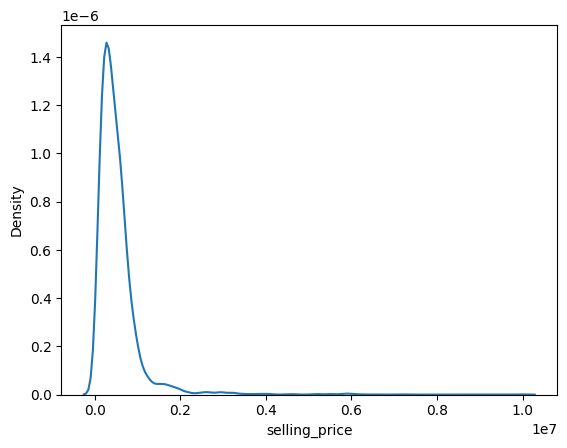

In [ ]:
sns.kdeplot(df_train['selling_price'])

Нашел информацию, что логарифмирование может помочь

<Axes: xlabel='selling_price', ylabel='Density'>

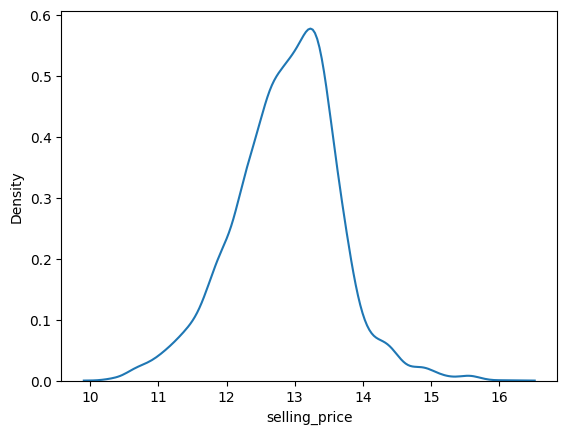

In [ ]:
sns.kdeplot(np.log(df_train['selling_price']))

Изменил распределение

In [ ]:
y_train_new = np.log(y_train)
y_test_new = np.log(y_test)

In [ ]:
X_train_new = X_train_new.fillna(0)

In [ ]:
from sklearn.linear_model import Ridge
from sklearn.model_selection import GridSearchCV

params = {'alpha' : np.linspace(0.0001, 100, 100)}

gs = GridSearchCV(Ridge(), params, cv=10, scoring='r2', verbose= 5, error_score = 'raise')

gs.fit(X_train_new, y_train_new)

Fitting 10 folds for each of 100 candidates, totalling 1000 fits
[CV 1/10] END .....................alpha=0.0001;, score=0.796 total time=   0.0s
[CV 2/10] END .....................alpha=0.0001;, score=0.784 total time=   0.0s
[CV 3/10] END .....................alpha=0.0001;, score=0.838 total time=   0.0s
[CV 4/10] END .....................alpha=0.0001;, score=0.832 total time=   0.0s
[CV 5/10] END .....................alpha=0.0001;, score=0.799 total time=   0.0s
[CV 6/10] END .....................alpha=0.0001;, score=0.833 total time=   0.0s
[CV 7/10] END .....................alpha=0.0001;, score=0.812 total time=   0.0s
[CV 8/10] END .....................alpha=0.0001;, score=0.850 total time=   0.1s
[CV 9/10] END .....................alpha=0.0001;, score=0.807 total time=   0.1s
[CV 10/10] END ....................alpha=0.0001;, score=0.820 total time=   0.0s
[CV 1/10] END .....................alpha=1.0102;, score=0.814 total time=   0.0s
[CV 2/10] END .....................alpha=1.0

GridSearchCV(cv=10, error_score='raise', estimator=Ridge(),
             param_grid={'alpha': array([1.00000e-04, 1.01020e+00, 2.02030e+00, 3.03040e+00, 4.04050e+00,
       5.05060e+00, 6.06070e+00, 7.07080e+00, 8.08090e+00, 9.09100e+00,
       1.01011e+01, 1.11112e+01, 1.21213e+01, 1.31314e+01, 1.41415e+01,
       1.51516e+01, 1.61617e+01, 1.71718e+01, 1.81819e+01, 1.91920e+01,
       2.02021e+01, 2.12122e+01, 2....
       7.07071e+01, 7.17172e+01, 7.27273e+01, 7.37374e+01, 7.47475e+01,
       7.57576e+01, 7.67677e+01, 7.77778e+01, 7.87879e+01, 7.97980e+01,
       8.08081e+01, 8.18182e+01, 8.28283e+01, 8.38384e+01, 8.48485e+01,
       8.58586e+01, 8.68687e+01, 8.78788e+01, 8.88889e+01, 8.98990e+01,
       9.09091e+01, 9.19192e+01, 9.29293e+01, 9.39394e+01, 9.49495e+01,
       9.59596e+01, 9.69697e+01, 9.79798e+01, 9.89899e+01, 1.00000e+02])},
             scoring='r2', verbose=5)

In [ ]:
print(gs.best_score_)
print(gs.best_params_)

0.8230412437450687
{'alpha': 46.4647}


In [ ]:
y_pred_train = gs.predict(X_train_new.select_dtypes(include = ['float64', 'int64']))
y_pred_test = gs.predict(X_test_new.select_dtypes(include = ['float64', 'int64']))

In [ ]:
from sklearn.metrics import r2_score, mean_squared_error as MSE
print(f'MSE для трейна равно {MSE(y_train_new, y_pred_train):.4f}')
print(f'MSE для теста равно {MSE(y_test_new, y_pred_test):.4f}')

print(f'r2 для трейна равно {r2_score(y_train_new, y_pred_train):.10f}')
print(f'r2 для теста равно {r2_score(y_test_new, y_pred_test):.10f}')

MSE для трейна равно 0.1000
MSE для теста равно 0.0952
r2 для трейна равно 0.8288225798
r2 для теста равно 0.8521413686


In [ ]:
with open("Model.pickle", "wb") as f:
    pickle.dump(gs, f)

Получилось улучшить метрики, но как будто где то ошибся)) Можете подсказать, где ошибка, если есть. А если нет, то почему произошло такое сильное улучшение?

Собираем пайплайн

К сожалению этот пайплайн так и не завелся вместе с FastApi

In [ ]:
import pandas as pd
import numpy as np
import re
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder, FunctionTransformer
from sklearn.base import BaseEstimator, TransformerMixin


class DropDuplicates(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self

    def transform(self, X):
        return X.drop_duplicates()

class DropDuplicateDescriptions(BaseEstimator, TransformerMixin):
    def __init__(self, target_column):
        self.target_column = target_column

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        features = X.drop(columns=[self.target_column], errors='ignore')
        duplicate_indices = features[features.duplicated(keep='first')].index
        X = X.drop('selling_price', axis = 1)
        return X.drop(index=duplicate_indices, errors='ignore').reset_index(drop=True)

class ExtractNumericValues(BaseEstimator, TransformerMixin):
    def __init__(self, columns):
        self.columns = columns

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        X_copy = X.copy()
        for column in self.columns:
            if column in X_copy.columns:
                X_copy[column] = X_copy[column].astype(str).str.extract(r'(\d+\.?\d*)', expand=False).astype(float)
            else:
                print(f"Warning: Column '{column}' not found in DataFrame.")
        return X_copy

def process_torque(row):
    if not isinstance(row, str) or pd.isna(row):
        return np.nan, np.nan

    try:
        clean_row = row.replace(",", "").replace("(", "").replace(")", "").replace("~", "-").strip().lower()
        numbers = [float(num) for num in re.findall(r"[\d.]+", clean_row)]

        if not numbers:
            return np.nan, np.nan

        if 'kgm' in clean_row:
            torque_value = min(numbers) * 9.8
            max_rpm = max(numbers)
        elif 'nm' in clean_row:
            torque_value = min(numbers)
            max_rpm = max(numbers)
        else:
            return np.nan, np.nan

        return round(torque_value, 2), max_rpm

    except Exception as e:
        print(f"Error processing row: {row} -> {e}")
        return np.nan, np.nan

class TorqueProcessor(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self

    def transform(self, X):
        X[['torque', 'max_torque_rpm']] = X['torque'].apply(lambda x: pd.Series(process_torque(x)))
        return X

class ConvertToInt(BaseEstimator, TransformerMixin):
    def __init__(self, columns):
        self.columns = columns

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        if isinstance(X, np.ndarray):
            X = pd.DataFrame(X, columns=numerical_features + [col for col in X_train_new.drop('selling_price',axis = 1).columns if col not in numerical_features])
        X_copy = X.copy()
        for column in self.columns:
            if column in X_copy.columns:
                X_copy[column] = pd.to_numeric(X_copy[column], errors='coerce')
                X_copy[column] = X_copy[column].fillna(0).astype(int)
            else:
                print(f"Warning: Column '{column}' not found in DataFrame.")
        return X_copy

class ProcessName(BaseEstimator, TransformerMixin):
    def __init__(self, stop_words, min_count=2):
        self.stop_words = stop_words
        self.min_count = min_count
        self.name_counts = []
        self.frequent_names = None

    def fit(self, X, y=None):
        self.name_counts = X['name'].value_counts()
        return self

    def transform(self, X):
        X_copy = X.copy()
        X_copy['name'] = X_copy['name'].str.lower()
        X_copy['name'] = X_copy['name'].str.strip()
        X_copy['name'] = X_copy['name'].str.replace(r'\s+', ' ', regex=True)
        X_copy['name'] = X_copy['name'].apply(lambda x: ' '.join([word for word in x.split() if word not in self.stop_words]))
        X_copy['name'] = X_copy['name'].apply(lambda x: ' '.join(x.split()[:2]))

        self.name_counts = X_copy['name'].value_counts()
        X_copy['name'] = X_copy['name'].apply(lambda x: x if self.name_counts[x] >= 5 else 'other')
        return X_copy

class ResetIndex(BaseEstimator, TransformerMixin):
    def __init__(self, drop=True):
        self.drop = drop

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        return X.reset_index(drop=self.drop)

class ReplaceOutliersAndZeros(BaseEstimator, TransformerMixin):
    def __init__(self, torque_threshold=1000, rpm_threshold=10000):
        self.torque_threshold = torque_threshold
        self.rpm_threshold = rpm_threshold

    def fit(self, X, y=None):
        return self

    def transform(self, X):
        X_copy = X.copy()
        X_copy.loc[X_copy['torque'] > self.torque_threshold, 'torque'] = X_copy['torque'].median()
        X_copy.loc[X_copy['max_torque_rpm'] > self.rpm_threshold, 'max_torque_rpm'] = X_copy['max_torque_rpm'].median()
        X_copy.loc[X_copy['max_power'] == 0, 'max_power'] = X_copy['max_power'].median()
        return X_copy


class AddPowerPerEngine(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self

    def transform(self, X):
        X['power_per_engine'] = X['max_power'] / X['engine']
        return X

class FillNaWithZeros(BaseEstimator, TransformerMixin):
    def fit(self, X, y=None):
        return self

    def transform(self, X):
        return X.fillna(0)


class CustomEncoder(BaseEstimator, TransformerMixin):
    def __init__(self, columns):
        self.columns = columns
        self.encoder = OneHotEncoder(drop="first", sparse_output=False, handle_unknown='ignore')
        self.encoded_columns = None

    def fit(self, X, y=None):
        self.encoder.fit(X[self.columns])
        self.encoded_columns = self.encoder.get_feature_names_out(self.columns)
        return self

    def transform(self, X):
        encoded_data = self.encoder.transform(X[self.columns])
        encoded_df = pd.DataFrame(encoded_data, columns=self.encoded_columns, index=X.index)
        X_transformed = pd.concat([X.drop(columns=self.columns, errors='ignore'), encoded_df], axis=1)
        return X_transformed

class CustomScaler(BaseEstimator, TransformerMixin):
    def __init__(self, columns):
        self.columns = columns
        self.scaler = StandardScaler()

    def fit(self, X, y=None):
        self.scaler.fit(X[self.columns])
        return self

    def transform(self, X):
        X_copy = X.copy()
        X_copy[self.columns] = self.scaler.transform(X_copy[self.columns])
        return X_copy


numerical_features = ['year', 'engine', 'mileage', 'max_power', 'torque', 'max_torque_rpm', 'seats']
categorical_columns = ['name', 'fuel', 'seller_type', 'transmission', 'owner', 'seats']
numeric_columns = ['year', 'km_driven', 'mileage', 'engine', 'max_power', 'torque', 'max_torque_rpm', 'power_per_engine']
stop_words = ['vdi', 'bsiii', 'tdi', 'vtvt', 'diesel', 'petrol', 'electric', 'ambition', 'sportz']


numerical_pipeline = Pipeline([
    ('imputer', SimpleImputer(strategy='median')),
])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_pipeline, numerical_features),
    ],
    remainder='passthrough'
)

pipeline = Pipeline([
    ('удаление_дубликатов', DropDuplicates()),
    ('удаление_одинаковых_описаний', DropDuplicateDescriptions(target_column='selling_price')),
    ('обновление_индексов', ResetIndex(drop=True)),
    ('извлечение_чисел', ExtractNumericValues(columns=['engine', 'mileage', 'max_power'])),
    ('обработка_крутящего_момента', TorqueProcessor()),
    ('заполнение_пропусков', preprocessor),
    ('преобразование_в_int', ConvertToInt(columns=['engine', 'seats'])),
    ('обработка_имени', ProcessName(stop_words=stop_words)),
    ('замена_выбросов', ReplaceOutliersAndZeros()),
    ('добавление_признака', AddPowerPerEngine()),
    ('кодирование_категорий', CustomEncoder(columns=categorical_columns)),
    ('масштабирование', CustomScaler(columns=numeric_columns)),
    ('заполнение_пропусков_нулями', FillNaWithZeros()),
])


df_train = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_train.csv')
df_test = pd.read_csv('https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_test.csv')

X_train_new = df_train
y_train = df_train['selling_price']
X_test_new = df_test
y_test = df_test['selling_price']


log_transformer = FunctionTransformer(np.log, validate=True)
y_train_transformed = log_transformer.fit_transform(y_train.values.reshape(-1, 1))

X_train_transformed = pipeline.fit_transform(X_train_new)

y_train_transformed = y_train_transformed[X_train_new.index.isin(X_train_transformed.index)]

from sklearn.linear_model import Ridge
model = Ridge(alpha=46.4647)
model.fit(X_train_transformed, y_train_transformed)

X_test_transformed = pipeline.transform(X_test_new)
y_test_aligned = y_test[X_test_new.index.isin(X_test_transformed.index)]
y_pred = model.predict(X_test_transformed)

y_pred_original_scale = np.exp(y_pred)

Быстренько решил сделать новый пайплайн. Его я и применил в сервисе

In [ ]:
import pandas as pd
import numpy as np
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.linear_model import Ridge
import pickle

url = 'https://raw.githubusercontent.com/Murcha1990/MLDS_ML_2022/main/Hometasks/HT1/cars_train.csv'
df = pd.read_csv(url)

numerical_features = ['year', 'km_driven', 'seats']
categorical_features = ['name', 'fuel', 'seller_type', 'transmission', 'owner']

numerical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())
])

categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='missing')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))
])

preprocessor = ColumnTransformer(
    transformers=[
        ('num', numerical_transformer, numerical_features),
        ('cat', categorical_transformer, categorical_features)
    ])

pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('model', Ridge(alpha=46.4647))
])

X = df.drop(columns=['selling_price'])
y = df['selling_price']

y_log = np.log(y)

pipeline.fit(X, y_log)

with open('pipeline.pickle', 'wb') as pipeline_file:
    pickle.dump(pipeline, pipeline_file)

with open('Model.pickle', 'wb') as model_file:
    pickle.dump(pipeline.named_steps['model'], model_file)

In [ ]:
X_train_transformed.columns

Index(['year', 'engine', 'mileage', 'max_power', 'torque', 'max_torque_rpm',
       'km_driven', 'power_per_engine', 'name_audi a6', 'name_audi q3',
       ...
       'owner_Test Drive Car', 'owner_Third Owner', 'seats_4', 'seats_5',
       'seats_6', 'seats_7', 'seats_8', 'seats_9', 'seats_10', 'seats_14'],
      dtype='object', length=151)

In [ ]:
!pip install dill

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 119.4/119.4 kB 2.2 MB/s eta 0:00:00


In [ ]:
with open('pipeline.pickle', 'wb') as pipeline_file:
    pickle.dump(pipeline, pipeline_file)

In [ ]:
with open("log_transformer.pickle", "wb") as f:
    pickle.dump(log_transformer, f)

In [ ]:
with open("Model.pickle", "wb") as f:
    pickle.dump(model, f)

# **Часть 4. | Бизнесовая (0.5 балла)**

### **Задание 23 (0.25 балла)**

В мире бизнеса очень важно давать оценку качества модели понятную бизнесу, поэтому иногда заказчики приходят с кастомными метриками. Попробуем сделать такую для нашей задачи.

**Описание метрики:**

Среди всех предсказанных цен на авто нужно посчитать долю прогнозов, отличающихся от реальных цен на эти авто не более чем на 10% (в одну или другую сторону)

**Ваша задача:**

- [ ] Реализуйте метрику `business_metric`
- [ ] Посчитайте метрику для всех обученных моделей и определеите, какаю лучше всего решает задачу бизнеса

In [ ]:
def business_metrics(y_true, y_pred):
    diff = np.abs(y_true - y_pred)
    relative_diff = 0.1 * y_true
    count = np.count_nonzero( diff <= relative_diff)
    return (count / len(y_true))

business_metrics(y_test_new, y_pred_test)

0.9968017057569296

### **Задание 24 (0.25 балла)**

Но у бизнеса не всегда есть идеи и иногда задача на выбор метрики делегируется вам.

**Задание:**

- [ ] Придумайте и реализуйте другую кастомную метрику с учетом того, что модель не должна сильно ошибаться в прогнозе, но недопрогноз для модели, согласно мнению бизнеса, хуже, чем перепрогноз.
- [ ] Посчитайте метрику для всех обученных моделей и определеите, какаю лучше всего решает задачу бизнеса



In [ ]:
def your_business_metrics(y_true, y_pred):

business_metrics(# your code here)

282405.5818444082

# **Часть 5 (3 балла) | Реализация сервиса на FastAPI**

### **Задание 25**

Cделайте с помощью FastAPI сервис, который с точки зрения пользователя реализует две функции:

1. на вход в формате json подаются признаки одного объекта, на выходе сервис выдает предсказанную стоимость машины
2. на вход подается csv-файл с признаками тестовых объектов, на выходе получаем файл с +1 столбцом - предсказаниями на этих объектах

С точки зрения реализации это означает следующее:
- средствами pydantic должен быть описан класс базового объекта
- класс с коллецией объектов
- метод post, который получает на вход один объект описанного класса
- метод post, который получает на вход коллекцию объектов описанного класса

Шаблон для сервисной части дан ниже. Код необходимо дополнить и оформить в виде отдельного .py-файла.

In [ ]:
from fastapi import FastAPI
from pydantic import BaseModel
from typing import List

app = FastAPI()


class Item(BaseModel):
    name: str
    year: int
    selling_price: int
    km_driven: int
    fuel: str
    seller_type: str
    transmission: str
    owner: str
    mileage: str
    engine: str
    max_power: str
    torque: str
    seats: float


class Items(BaseModel):
    objects: List[Item]


@app.post("/predict_item")
def predict_item(item: Item) -> float:
    return ...


@app.post("/predict_items")
def predict_items(items: List[Item]) -> List[float]:
    return ...

Протестируйте сервис на корректность работы и приложите скриншоты (см. ниже).

# **Часть 6 (1 балл) | Оформление результатов**

### **Задание 26**

**Результаты вашей работы** необходимо разместить в своем Гитхабе. Под результатами понимаем следующее:
* ``.ipynb``-ноутбук со всеми проведёнными вами экспериментами (output'ы ячеек, разумеется, сохранить)
* ``.py``-файл с реализацией сервиса
* ``.pickle``-файл с сохранёнными весами модели, коэффициентами скейлинга и прочими числовыми значениями, которые могут понадобиться для инференса
* ``.md``-файл с выводами про проделанной вами работе:
    * что было сделано
    * с какими результатами
    * что дало наибольший буст в качестве
    * что сделать не вышло и почему (это нормально, даже хорошо😀)

**За что могут быть сняты баллы в этом пункте:**
* за отсутствие ``.pickle``-файла с весами использованной модели
* за недостаточную аналитику в ``.md``-файле
* за оформление и логику кода (в определённом смысле это тоже элемент оформления решения)

**Как будет выглядет проверка всего домашнего задания?**
1. Ассистент проходит по ссылке на (**открытый**) репозиторий из Энитаска
2. Смотрит ``readme.md``:
    * пожалуйста, приложите в него же скрины работы вашего сервиса -- собирать ваши проекты довольно времязатратно, но хочется убедиться, что всё работает
    * можете в md-файл приложить ссылку на screencast с демонстрацией

3. Просматривает ноутбук с DS частью
4. Заглядывает в код сервиса
5. Хвалит

# **Часть Благодарственная**

Надеемся, вы честно проделали все пункты, а не просто пролистали досюда. Потому что здесь награда за старания. Пожалуйста, не стоит награждать себя до того, как закончите работать над домашкой.

<details>
<summary><b>Что-то приятное</b></summary>

**Напоминаем, что нашем курсе действует система кото-бонусов** 🐈

На фото по ссылке — сэр кот кого-то из команды курса (преподаватель, помощник преподавателя, ассистенты).

Предлагаем вам угадать — чей это товарищ!

[Первый кот](https://ibb.co/Kz1ZRWj)

</details>

# ghghhg